# Obligatorio - Taller de Deep Learning

**Fecha de entrega:** 3/12/2025  
**Puntaje máximo:** 50 puntos

**Alumno(s):** Natialia Campiglia - Maria Jose Carbajal

## Obligatorio

El objetivo de este obligatorio es evaluar su conocimiento en Deep Learning mediante la implementación completa de un modelo de segmentación de imágenes basado en el paper [**"U-Net: Convolutional Networks for Biomedical Image Segmentation"**](https://arxiv.org/pdf/1505.04597). Toda la implementación debe realizarse desde cero utilizando PyTorch, y los estudiantes tendrán la libertad de ajustar ciertos hiperparámetros y configuraciones mientras mantengan la esencia del paper original.

### **Competencia en Kaggle**

Además, como parte de este obligatorio, participarán en una competencia privada en Kaggle donde se les proporcionará un dataset de test oculto (sin target). Deberán subir sus predicciones a Kaggle y se evaluarán en función de la métrica **Dice Coefficient (Coeficiente de Dice)**. Esta competencia les permitirá comparar sus resultados con los de sus compañeros en un entorno real de evaluación.

### **¿Qué es el Dice Coefficient?**
El **Dice Coefficient**, también conocido como F1-score para segmentación, es una métrica utilizada para evaluar la similitud entre la predicción y la verdad del terreno en tareas de segmentación. Se define de la siguiente manera:

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

Donde:
- $A$ es el conjunto de píxeles predichos como pertenecientes a la clase positiva.
- $B$ es el conjunto de píxeles verdaderos pertenecientes a la clase positiva.
- $|A \cap B|$ es la intersección de $A$ y $B$, es decir, los píxeles correctamente predichos como positivos.

Un valor de Dice de **1** indica una predicción perfecta, mientras que un valor de **0** indica que no hay coincidencia entre la predicción y el valor verdadero. Durante la competencia de Kaggle, deberán obtener un puntaje de al menos **0.75** en la métrica Dice para considerarse aprobados.

### **Criterios a Evaluar**

1. **Análisis del Dataset (5 puntos):**
   - Exploración y visualización del dataset para comprender su estructura y características.
   - Justificación de las decisiones tomadas en la preprocesamiento de datos, como normalización, aumento de datos (data augmentation), y partición del dataset en conjuntos de entrenamiento, validación y prueba.

2. **Implementación Correcta del Modelo U-Net (20 puntos):**
   - Construcción de la arquitectura U-Net siguiendo la estructura descrita en el paper, permitiendo ajustes como el número de filtros, funciones de activación y métodos de inicialización de pesos.
   - Se aceptan mejoras como el uso de técnicas adicionales como batch normalization, otras funciones de activación, etc.

3. **Entrenamiento del Modelo (10 puntos):**
   - Configuración adecuada del ciclo de entrenamiento, incluyendo la elección de la función de pérdida y del optimizador (Adam, SGD, etc.).
   - Uso de técnicas de regularización para mejorar la generalización del modelo, como el dropout, normalización de batch y data augmentation.
   - Gráficas y análisis de la evolución del entrenamiento, mostrando las curvas de pérdida y métricas relevantes tanto en el conjunto de entrenamiento como en el de validación.
   - Puede utilizarse experimentación con hiperparámetros con Weights & Biases (W&B) para optimizar el rendimiento del modelo. Este punto no es obligatorio, pero se valorará positivamente si se justifica su uso y se presentan resultados claros.

4. **Evaluación de Resultados (10 puntos):**
   - Evaluación exhaustiva del modelo utilizando métricas de segmentación como **Dice Coefficient**.
   - Análisis detallado de los resultados, incluyendo un análisis de errores para identificar y discutir casos difíciles.
   - Visualización de ejemplos representativos de segmentaciones correctas e incorrectas, comparando con las etiquetas manuales proporcionadas en el dataset.

5. **Participación y Resultados en la Competencia Kaggle (5 puntos):**
   - Participación activa en la competencia de Kaggle, con al menos una (1) subida de predicción.
   - Puntaje obtenido en la tabla de posiciones de Kaggle, evaluado en base al **Dice Coefficient** en el conjunto de test oculto. Es necesario obtener al menos un valor de **0.75** para esta métrica.

   Notas:
   - **Cualquier decisión debe ser justificada en el notebook.**
   - El **Dice Coefficient** es la métrica utilizada para evaluar la precisión de los modelos de segmentación de imágenes en esta competencia.

### **Run-Length Encoding (RLE)**

Dado que no se suben las imágenes segmentadas directamente a Kaggle, se requiere usar **Run-Length Encoding (RLE)** para comprimir las máscaras de predicción en una cadena de texto que será evaluada. El **RLE** es una técnica de compresión donde se representan secuencias consecutivas de píxeles en formato `start length`, indicando la posición de inicio y la longitud de cada secuencia de píxeles positivos.

Para calcular el **RLE**, se sigue el siguiente proceso:

1. Se aplanan las máscaras predichas en un solo vector
2. Se identifican los píxeles con valor positivo (1) y se calculan las secuencias consecutivas.
3. Se registra la posición de inicio de cada secuencia y su longitud en formato `start length`.

Este formato comprimido se sube a Kaggle en lugar de las imágenes segmentadas.

#### **Ejemplo de RLE**

```python
import numpy as np

def rle_encode(mask):
    pixels = np.array(mask).flatten(order='F')  # Aplanar la máscara en orden Fortran
    pixels = np.concatenate([[0], pixels, [0]])  # Añadir ceros al principio y final
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1  # Encontrar transiciones
    runs[1::2] = runs[1::2] - runs[::2]  # Calcular longitudes
    return ' '.join(str(x) for x in runs)

mask = np.array([[0, 0, 1, 0, 0],
                 [0, 1, 1, 1, 0],
                 [1, 1, 1, 0, 0],
                 [0, 0, 0, 1, 1]])

print(rle_encode(mask))
```

> **Salida:** 3 1 6 2 9 3 14 1 16 1 20 1


### **Sobre el Dataset**

El dataset proporcionado para esta tarea incluirá imágenes y máscaras para la segmentación de un conjunto específico de clases. El conjunto de entrenamiento estará disponible para su uso durante todo el proceso de desarrollo y pruebas, mientras que el conjunto de validación se mantendrá oculto para la evaluación final en Kaggle.

### **Instrucciones de Entrega**

- Deberán entregar un Jupyter Notebook (.ipynb) que contenga todo el código y las explicaciones necesarias para ejecutar la implementación, el entrenamiento y la evaluación del modelo.
- El notebook debe incluir secciones bien documentadas explicando las decisiones de diseño del modelo, los experimentos realizados, y los resultados obtenidos.
- El código debe estar escrito de manera clara.
- La entrega debe realizarse a través de la plataforma de gestión de ORT (gestion.ort.edu.uy) antes de la fecha límite.

### **Materiales Adicionales**

Para facilitar su trabajo, pueden consultar los siguientes recursos:

- [U-Net: Convolutional Networks for Biomedical Image Segmentation (paper original)](https://arxiv.org/abs/1505.04597)
- [Documentación de PyTorch](https://pytorch.org/docs/stable/index.html)
- [Tutoriales y recursos adicionales en Kaggle](https://www.kaggle.com/)
- [Convolución Transpuesta](https://d2l.ai/chapter_computer-vision/transposed-conv.html)

### **Competencia Kaggle**

[Link a la competencia Kaggle](https://www.kaggle.com/competitions/tdl-obligatorio-2025)

---

## Integrantes del grupo

Natalia Campiglia - 349251

Maria Jose Carbajal - 241319

# Imports e inicializaciones

In [2]:
!pip install kaggle
!pip install torchinfo

In [3]:
import os
import json
import random
import hashlib

import matplotlib.pyplot as plt
import numpy as np
import math

from PIL import Image
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import random_split, DataLoader, Dataset, Subset

from torchinfo import summary

import torchvision.transforms.v2 as T
from torchvision import tv_tensors
from torchvision.transforms import InterpolationMode


from utils import (
    train,
    plot_training,
    predict_and_build_submission,
    restaurar_modelo,
    dice_on_val_with_postproc,
    predict_and_build_submission_tta,
    visualizar_test,
    model_segmentation_report
)

### Reload imports sin necesidad de restart la notebook

In [4]:
import importlib
import sys
if 'utils' in sys.modules:
    importlib.reload(sys.modules['utils'])

In [5]:
# Fijamos la semilla para que los resultados sean reproducibles
SEED = 23

torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [6]:
import sys

# definimos el dispositivo que vamos a usar
DEVICE = "cpu"  # por defecto, usamos la CPU
if torch.cuda.is_available():
    DEVICE = "cuda"  # si hay GPU, usamos la GPU
elif torch.backends.mps.is_available():
    DEVICE = "mps"  # si no hay GPU, pero hay MPS, usamos MPS
elif torch.xpu.is_available():
    DEVICE = "xpu"  # si no hay GPU, pero hay XPU, usamos XPU

print(f"Usando {DEVICE}")

NUM_WORKERS = 0 # Win y MacOS pueden tener problemas con múltiples workers
if sys.platform == 'linux':
    NUM_WORKERS = 4  # numero de workers para cargar los datos (depende de cada caso)

print(f"Usando {NUM_WORKERS}")

Usando mps
Usando 0


## Constantes

In [7]:
BATCH_SIZE = 8  # tamaño del batch
IMG_SIZE = 256 # paper original: 572
NUM_CLASES = 1

IMG_FOLDER = "data/train/images"
MASK_FOLDER = "data/train/masks"
TEST_FOLDER = "data/test/images"

IMG_PATH = Path(IMG_FOLDER)
MASK_PATH = Path(MASK_FOLDER)
TEST_PATH = Path(TEST_FOLDER)


# Descarga de datos

In [123]:
with open("config/kaggle.json") as f:
    creds = json.load(f)

os.environ["KAGGLE_USERNAME"] = creds["username"]
os.environ["KAGGLE_KEY"] = creds["key"]

In [124]:
!kaggle competitions download -c tdl-obligatorio-2025

tdl-obligatorio-2025.zip: Skipping, found more recently modified local copy (use --force to force download)


In [125]:
!unzip -o -qq tdl-obligatorio-2025.zip -d data/

# Exploración de datos

## Ver selección random de imágenes y sus máscaras

3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)


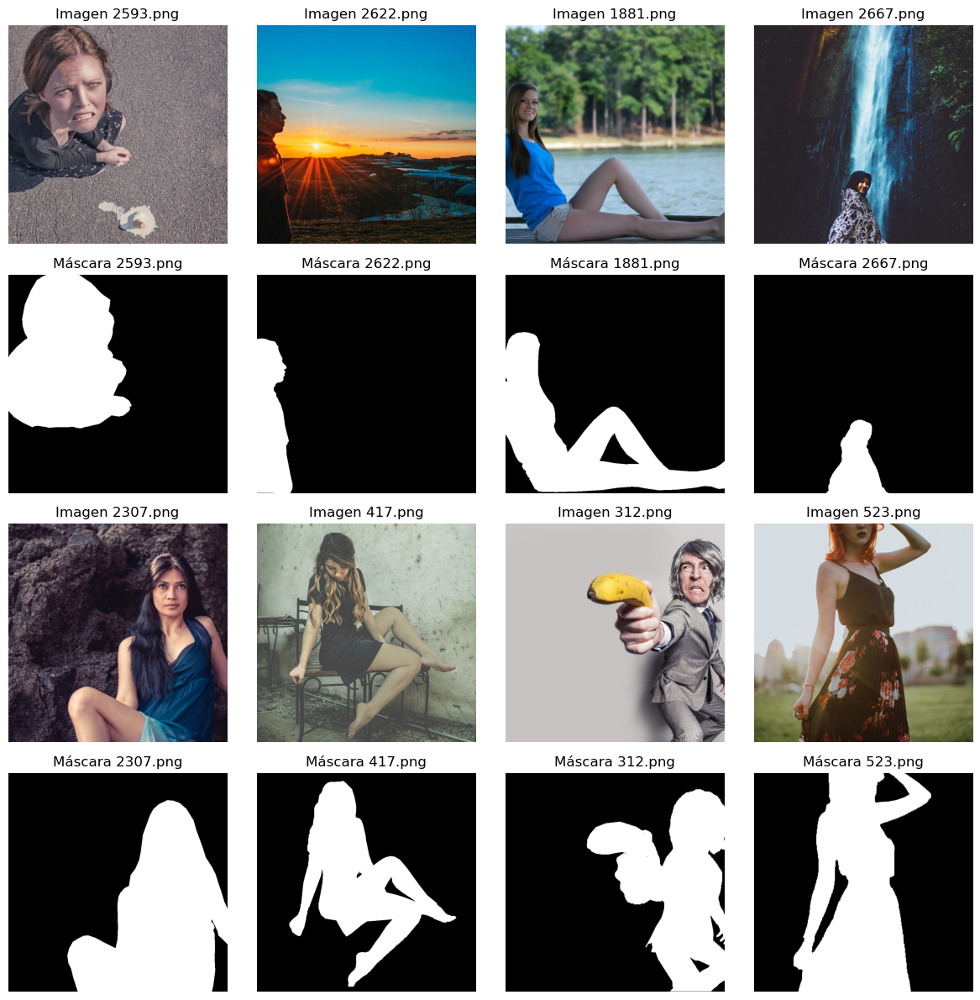

In [126]:
files = random.sample(os.listdir(IMG_FOLDER), 8)  # 8 imágenes → 4 filas de pares

MASK = None

plt.figure(figsize=(12, 12))
for i, f in enumerate(files):
    img = Image.open(os.path.join(IMG_FOLDER, f))
    mask_path = os.path.join(MASK_FOLDER, f)
    mask = np.array(Image.open(mask_path))
    print(mask.ndim,mask.shape)
    if mask.ndim == 3:
        mask = mask.max(axis=2)

    MASK = mask

    # Fila 1 y 3: imágenes (i=0..3 e i=4..7)
    if i < 4:
        plt.subplot(4, 4, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Imagen {f}")
        plt.subplot(4, 4, i + 1 + 4)
        plt.imshow(mask, cmap="gray", vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Máscara {f}")
    else:
        j = i - 4
        plt.subplot(4, 4, j + 1 + 8)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Imagen {f}")
        plt.subplot(4, 4, j + 1 + 12)
        plt.imshow(mask, cmap="gray", vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Máscara {f}")

plt.tight_layout()
plt.show()


## Ver tamaños de imágenes y máscaras

In [128]:
sizes = set()
for fname in os.listdir(IMG_FOLDER):
    if 'png' in fname:
        path = os.path.join(IMG_FOLDER, fname)
        with Image.open(path) as img:
            sizes.add(img.size)

print("Tamaño de imagenes:")
for size in sizes:
    print(size)

sizes = set()
for fname in os.listdir(MASK_FOLDER):
    if 'png' in fname:
        path = os.path.join(MASK_FOLDER, fname)
        with Image.open(path) as img:
            sizes.add(img.size)

print("Tamaño de máscaras:")
for size in sizes:
    print(size)

Tamaño de imagenes:
(800, 800)
Tamaño de máscaras:
(800, 800)


Confirmamos que todas las imágenes y las máscaras tienen el mismo tamaño.

## Buscar duplicados

In [129]:
def md5_file(path: Path):
    with path.open("rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hashes = {}
duplicates = []

for path in IMG_PATH.iterdir():
    if path.is_file():
        h = md5_file(path)
        if h in hashes:
            duplicates.append((str(path), str(hashes[h])))
        else:
            hashes[h] = path

print(f"Encontradas {len(duplicates)} imágenes duplicadas.")

Encontradas 0 imágenes duplicadas.


## Formato y canales

In [130]:
img_channel_counts = set()
mask_channel_counts = set()
mask_unique_values = set()

for img_path, mask_path in zip(sorted(IMG_PATH.iterdir()), sorted(MASK_PATH.iterdir())):
    if img_path.suffix.lower() not in [".jpg", ".png", ".jpeg"]:
        continue

    # Imagen
    # escala de grises: (hight, width) -> 1 canal
    # RGB: (hight, width, channels) = (height, width, 3) -> 3 canales
    # RGBA: (hight, width, 4)
    try:
        img = np.array(Image.open(img_path))
        img_channels = 1 if img.ndim == 2 else img.shape[2]
        img_channel_counts.add(img_channels)

        # Máscara
        mask = np.array(Image.open(mask_path))
        mask_channels = 1 if mask.ndim == 2 else mask.shape[2]
        mask_channel_counts.add(mask_channels)

        # Valores únicos de cada máscara (agrega como tupla)
        mask_unique_values.add(tuple(np.unique(mask)))
    except:
        pass

print(f"Canales únicos en imágenes: {img_channel_counts}")
print(f"Canales únicos en máscaras: {mask_channel_counts}")
print(f"Conjuntos de valores únicos en máscaras: {mask_unique_values}")

Canales únicos en imágenes: {1, 3, 4}
Canales únicos en máscaras: {3}
Conjuntos de valores únicos en máscaras: {(np.uint8(0), np.uint8(1)), (np.uint8(1),)}


Las máscaras son todas RGB pero para para las imágenes tenemos en formato blanco y negro, RGB y RGBA.

EL RGBA es como RGB más informacion de transparencia de la imagen; este 4to canal no nos aporta información util para este problema.

Para que las imagenes tengan todas la misma cantidad de canales a la entrada de la red, decidimos pasarlas todas a RGB porque RGBA no aporta más información y pasarlo a blanco y negro nos hace perder colores e intensidad que podrian ayudar al modelo a distinguir la persona del fondo.

## Mean y STD

 **Imágenes en blanco y negro**

In [8]:
# MEAN y STD para imagenes en blanco y negro.
imgs = []
for p in IMG_PATH.iterdir():
    img = Image.open(p).convert("L")
    arr = np.array(img, dtype=np.float32) / 255.0
    imgs.append(arr)

arr = np.stack(imgs)
MEAN_BYN = arr.mean()
STD_BYN = arr.std()

print(f"Mean: {MEAN_BYN} ; STD: {STD_BYN}")

Mean: 0.49048951268196106 ; STD: 0.29865914583206177


 **Imágenes en RGB**

In [9]:
paths = [os.path.join(IMG_FOLDER, f) for f in os.listdir(IMG_FOLDER) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.tif','.tiff'))]

# Función de carga forzada a RGB porque algunas estan en RGBA o blanco y negro (L)
def load_rgb(path):
    im = Image.open(path)
    if im.mode != 'RGB':
        im = im.convert('RGB')
    return im

# Media/STD por canal con acumulacion
sum_c = torch.zeros(3, dtype=torch.float64)
sum_sq_c = torch.zeros(3, dtype=torch.float64)
pix_count_c = torch.zeros(3, dtype=torch.float64)

for p in paths:
    try:
        im = load_rgb(p)
        arr = torch.from_numpy(np.asarray(im))  # H x W x 3, uint8
        t = arr.permute(2,0,1).to(torch.float64) / 255.0  # 3 x H x W , [0,1]

        # acumula por canal suma y suma de los cuadrados
        csum = t.view(3, -1).sum(dim=1)
        csum_sq = (t**2).view(3, -1).sum(dim=1)
        n_pix = torch.tensor([t.shape[1]*t.shape[2]]*3, dtype=torch.float64)

        sum_c += csum
        sum_sq_c += csum_sq
        pix_count_c += n_pix
    except Exception as e:
        pass

MEAN_RGB = (sum_c / pix_count_c).to(torch.float32)
STD_RGB = torch.sqrt((sum_sq_c / pix_count_c) - MEAN_RGB.double()**2).to(torch.float32)

print("mean =", MEAN_RGB.tolist(), "std =", STD_RGB.tolist())

/var/folders/s2/p5yczv2s3gv32c5qs90gpnh00000gn/T/ipykernel_81763/869946575.py:18: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/miniforge3/conda-bld/libtorch_1753839000881/work/torch/csrc/utils/tensor_numpy.cpp:209.)
  arr = torch.from_numpy(np.asarray(im))  # H x W x 3, uint8


mean = [0.5149781107902527, 0.4839880168437958, 0.4597202241420746] std = [0.31370314955711365, 0.3028314411640167, 0.30339837074279785]


**MEAN:**

Los tres canales tienen valores similares por lo que no hay un color que sea mas dominante que otro.

Los valores estan al rededor del 50% lo que indica que las imagenes tienen una exposicion a la luz pareja.

El rojo aparece un poco mas intenso que los demás.

**STD:**

El STD en este caso mide cuánto varía la intensidad de los pixeles en cada canal.

Por lo que vemos, la variacion para los 3 canales es similar. Un valor de 0.3 nos indica que hay bastante variedad de tonos e intensidades; esto probablemente se deba a que las imagenes tienen zonas claras y oscuras, sombras, piel, ropa, y diversos fondos.

## Histograma de colores en las imágenes

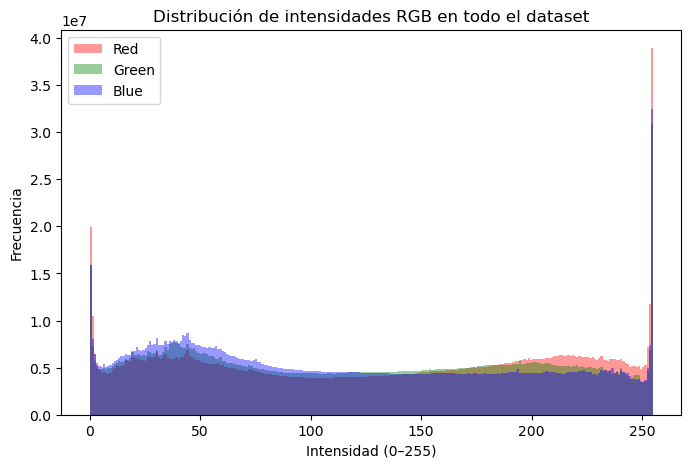

In [132]:
# Acumuladores de cada canal
r_vals, g_vals, b_vals = [], [], []

for p in IMG_PATH.iterdir():
    if p.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
        continue
    img = np.array(Image.open(p).convert("RGB"))
    # achatar para juntar todos los píxeles
    r, g, b = img[..., 0].ravel(), img[..., 1].ravel(), img[..., 2].ravel()
    r_vals.append(r)
    g_vals.append(g)
    b_vals.append(b)

# concatenar todos los valores
r_vals = np.concatenate(r_vals)
g_vals = np.concatenate(g_vals)
b_vals = np.concatenate(b_vals)

# histograma combinado
plt.figure(figsize=(8,5))
plt.hist(r_vals, bins=256, color='r', alpha=0.4, label='Red')
plt.hist(g_vals, bins=256, color='g', alpha=0.4, label='Green')
plt.hist(b_vals, bins=256, color='b', alpha=0.4, label='Blue')
plt.legend()
plt.title("Distribución de intensidades RGB en todo el dataset")
plt.xlabel("Intensidad (0–255)")
plt.ylabel("Frecuencia")
plt.show()


Los picos en 0 y 255 indican que hay muchos píxeles completamente negros o completamente blancos.

Entre los extremos, vemos que la densidad es relativamente plana, lo que indica amplia variación en los colores.

Las curvas roja, verde y azul son muy similares por lo que vemos que los colores están bastante balanceados en las imagenes del dataset.

## Analizar qué porcentaje de la imagen es ocupado por la persona

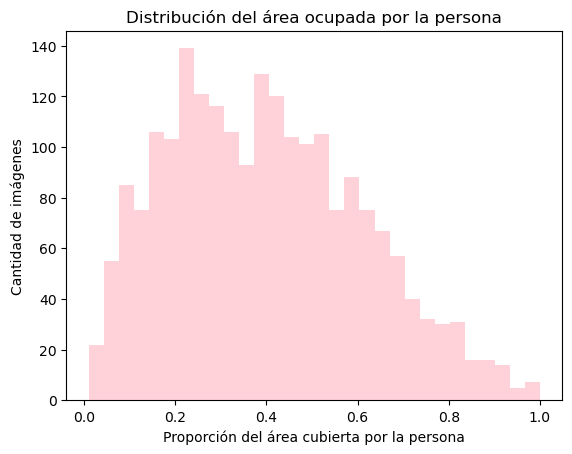

Cobertura promedio: 0.399
Rango: 0.010 – 1.000


In [133]:
coverages = [] # cantidad de pixeles identificados como persona

for p in MASK_PATH.glob("*.png"):
    mask = np.array(Image.open(p))[:, :, 0]   # un canal, valores {0,1}
    h, w = mask.shape
    coverage = mask.sum() / (h * w)
    coverages.append(coverage)

coverages = np.array(coverages)

plt.hist(coverages, bins=30, color='pink', alpha=0.7)
plt.xlabel("Proporción del área cubierta por la persona") # 0 nada , 1 toda la imagen
plt.ylabel("Cantidad de imágenes")
plt.title("Distribución del área ocupada por la persona")
plt.show()

print(f"Cobertura promedio: {coverages.mean():.3f}")
print(f"Rango: {coverages.min():.3f} – {coverages.max():.3f}")


Podemos ver que en la mayoría de los casos, la persona ocupa el 40% de la imagen, es decir, el 60% de la imagen es el fondo.

Encontradas: 31 imágenes con cobertura <= 0.050


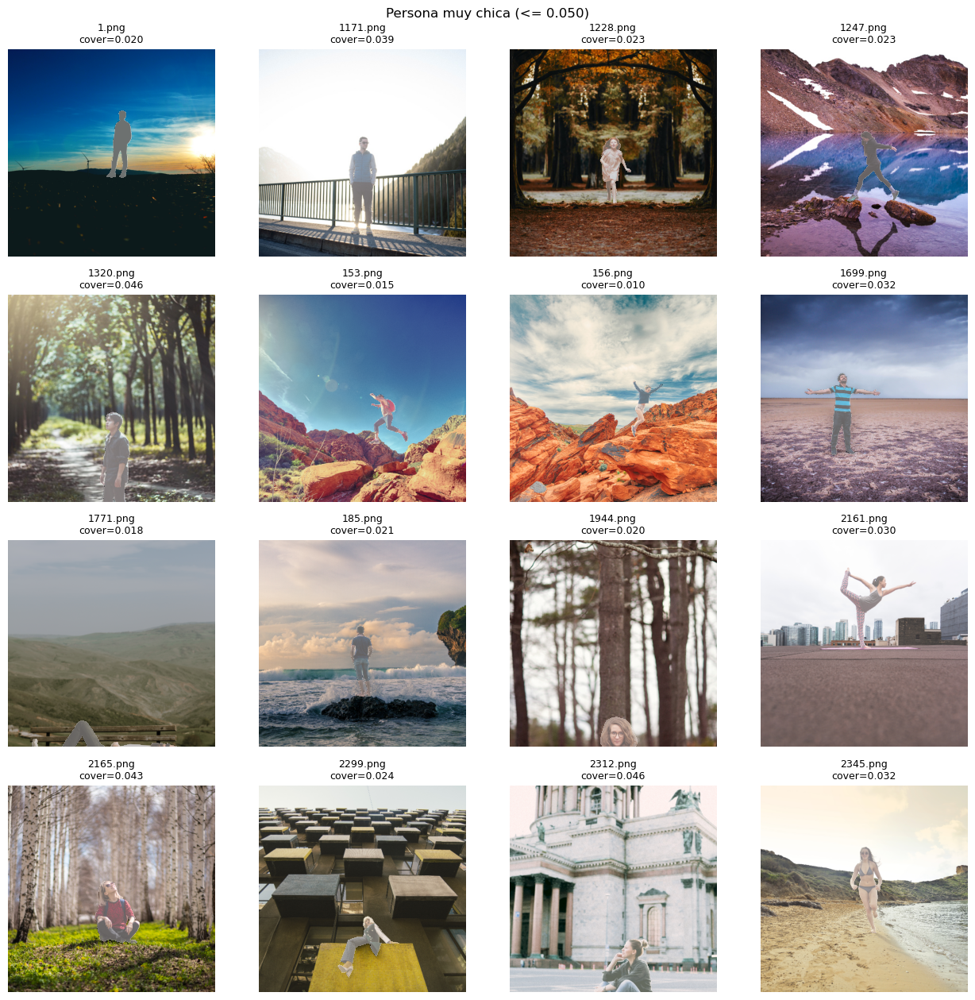

Encontradas: 51 imágenes con cobertura >= 0.850


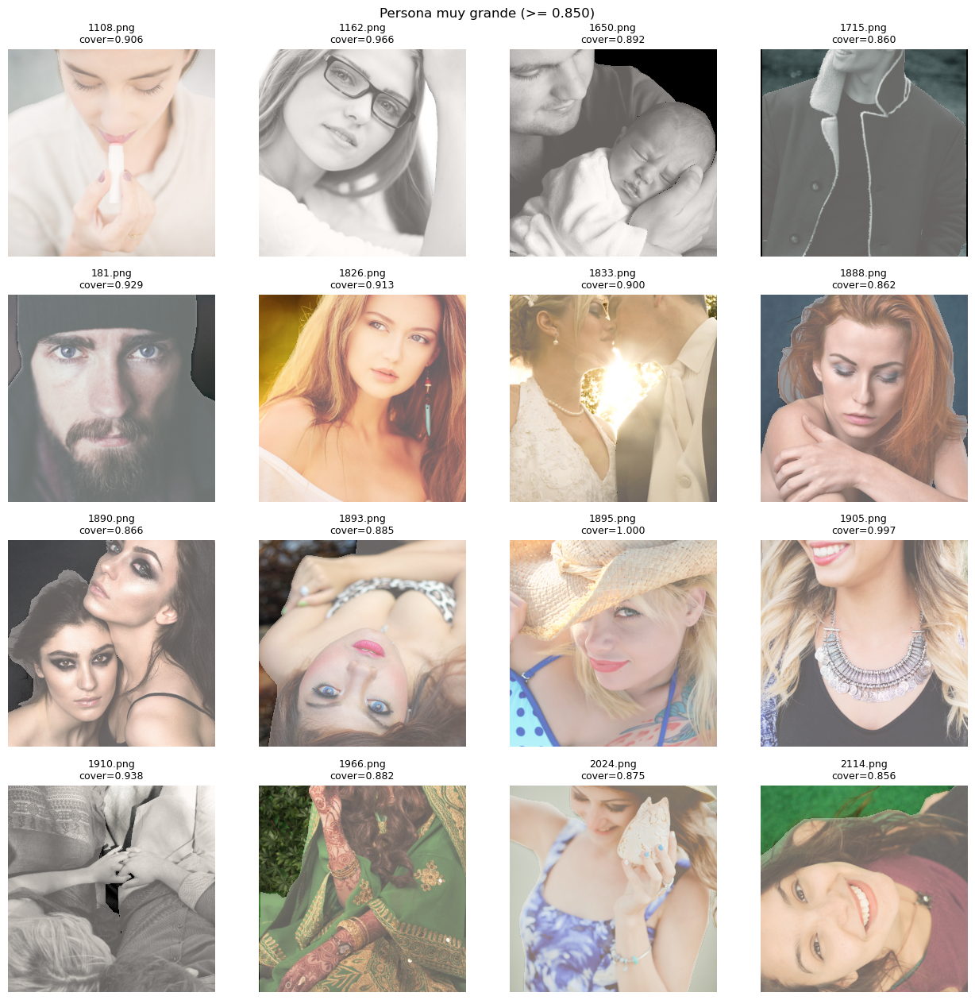

In [134]:
def _read_mask(path):
    m = np.array(Image.open(path))
    if m.ndim == 3:
        m = m[:, :, 0]
    m = (m > 0).astype(np.uint8)
    return m  # HxW en {0,1}

def _read_rgb(path):
    im = Image.open(path)
    if im.mode != "RGB":
        im = im.convert("RGB")
    return np.array(im)      # HxWx3 uint8

def _coverage(mask):
    h, w = mask.shape
    return float(mask.sum()) / float(h * w + 1e-9)

def _build_image_index(image_dir):
    image_dir = Path(image_dir)
    idx = {}
    for p in image_dir.rglob("*"):
        if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}:
            idx[p.stem] = p
    return idx

def _overlay(ax, img, mask, alpha=0.35):
    ax.imshow(img)
    ax.imshow(np.where(mask>0, 1.0, np.nan), cmap="Reds", alpha=alpha, interpolation="nearest")
    ax.axis("off")

# persona muy chica (cobertura <= max_frac)

def find_small_person_with_overlay(mask_dir, image_dir, max_frac=0.10, sample_show=12, cols=4, alpha=0.35):
    mask_dir = Path(mask_dir)
    image_idx = _build_image_index(image_dir)

    matches, fracs = [], []
    paths = sorted([p for p in mask_dir.rglob("*") if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}])

    for mp in paths:
        m = _read_mask(mp)
        f = _coverage(m)
        if f <= max_frac:
            if mp.stem in image_idx:
                matches.append((image_idx[mp.stem], mp))
                fracs.append(f)

    print(f"Encontradas: {len(matches)} imágenes con cobertura <= {max_frac:.3f}")

    if matches:
        k = min(sample_show, len(matches))
        rows = math.ceil(k / cols)
        plt.figure(figsize=(3.2*cols, 3.2*rows))
        for i, (ip, mp) in enumerate(matches[:k]):
            img = _read_rgb(ip); m = _read_mask(mp)
            ax = plt.subplot(rows, cols, i+1)
            _overlay(ax, img, m, alpha=alpha)
            ax.set_title(f"{ip.name}\ncover={_coverage(m):.3f}", fontsize=9)
        plt.suptitle(f"Persona muy chica (<= {max_frac:.3f})")
        plt.tight_layout()
        plt.show()

    return matches, fracs  # lista de (image_path, mask_path), y coberturas


# persona muy grande (cobertura >= min_frac)

def find_large_person_with_overlay(mask_dir, image_dir, min_frac=0.80, sample_show=12, cols=4, alpha=0.35):
    mask_dir = Path(mask_dir)
    image_idx = _build_image_index(image_dir)

    matches, fracs = [], []
    paths = sorted([p for p in mask_dir.rglob("*") if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}])

    for mp in paths:
        m = _read_mask(mp)
        f = _coverage(m)
        if f >= min_frac:
            if mp.stem in image_idx:
                matches.append((image_idx[mp.stem], mp))
                fracs.append(f)

    print(f"Encontradas: {len(matches)} imágenes con cobertura >= {min_frac:.3f}")

    if matches:
        k = min(sample_show, len(matches))
        rows = math.ceil(k / cols)
        plt.figure(figsize=(3.2*cols, 3.2*rows))
        for i, (ip, mp) in enumerate(matches[:k]):
            img = _read_rgb(ip); m = _read_mask(mp)
            ax = plt.subplot(rows, cols, i+1)
            _overlay(ax, img, m, alpha=alpha)
            ax.set_title(f"{ip.name}\ncover={_coverage(m):.3f}", fontsize=9)
        plt.suptitle(f"Persona muy grande (>= {min_frac:.3f})")
        plt.tight_layout()
        plt.show()

    return matches, fracs

# alpha transparencia con la que se superpone imagen y mascara

small, small_fracs = find_small_person_with_overlay(
    mask_dir=MASK_FOLDER, image_dir=IMG_FOLDER,
    max_frac=0.05, sample_show=16, cols=4, alpha=0.4
)

large, large_fracs = find_large_person_with_overlay(
    mask_dir=MASK_FOLDER, image_dir=IMG_FOLDER,
    min_frac=0.85, sample_show=16, cols=4, alpha=0.4
)


## Conclusión de la exploración de datos

El conjunto de datos presenta imagenes y máscaras del mismo tamaño (800×800 px) y sin duplicados.

Las máscaras son todas RGB, mientras que las imágenes originales poseen entre 1, 3 y 4 canales. El canal adicional de las imágenes RGBA corresponde a transparencia, que no aporta información útil para la segmentación; por lo tanto, se decidió convertir todas las imágenes a RGB para unificar la entrada de la red y conservar la información de color relevante. De todas maneras, se probará primero con imagenes de entrada en blanco y negro para ser fieles al paper.

Los valores de MEAN y STD por canal son similares entre sí, confirmando buen balance de colores y bastante variabilidad en intensidades. El histograma de intensidades refuerza estas observaciones, demostrando que el dataset no tiene sesgos de color.

El análisis del espacio ocupado por la persona en la imagen demuestra una ocupación promedio del 40%, con un rango de 0.01 a 1. Esto significa que hay gran variación de escala de personas en las imágenes, donde encontramos tanto primeros planos como imagenes donde la persona está muy chica y es casi todo fondo.

En conclusión, el dataset está balanceado en términos de color y es diverso, lo que es adecuado para entrenar un modelo de segmentación.
Antes del entrenamiento, se deben normalizar las imágenes con los valores calculados de MEAN y STD.

Vamos a probar entrenar con un mínimo de transformaciones para empezar.

Luego veremos si el resultado mejora al aplicar data augmentation, ya que la variabilidad que hay en nuestro dataset ayuda a generalizar pero también hace que sea dificil de aprender.

# Dataset y Dataloaders

El dataset contiene una carpeta train, con imagenes y máscaras, y una carpeta test, solamente con imagenes.

Para poder entrenar y generar métricas, dividiremos la carpeta de train en train/val/test_local con una proporción de 80%/10%/10%.

Definimos la clase SegDataset para generar train/val/test_local manteniendo los pares (imagen, mascara).

**Load Image**

In [10]:
def load_image(path, rgb):
    #  "L" convierte a escala de grises
    img = Image.open(path).convert("RGB" if rgb else "L")
    arr = np.array(img, dtype=np.float32) / 255.0  # (H, W, 3) o (H, W)

    if rgb:
        # pasar de (H, W, 3) → (3, H, W)
        arr = np.transpose(arr, (2, 0, 1))
    else:
        # pasar de (H, W) → (1, H, W)
        arr = np.expand_dims(arr, axis=0)

    tensor = torch.from_numpy(arr)
    return tensor

**Lista de nombres de imagenes**

In [11]:
def get_image_names():
    # Emparejar por nombre
    img_files = sorted([p for p in IMG_PATH.iterdir() if p.is_file()])
    names = []
    for p in img_files:
        mask_p = MASK_PATH / p.name
        if mask_p.exists():
            names.append(p.name)
    if not names:
        raise RuntimeError(f"No se encontraron pares imagen-máscara en {IMG_PATH} y {MASK_PATH}")

    return names

### Dataset

In [12]:
class SegDataset(Dataset):
    """
    Lee pares (imagen, máscara) desde:
      root/images/*.png|jpg...
      root/masks/  con el mismo nombre de archivo
    Devuelve tensores: img -> float32 [0,1], (C,H,W); mask -> long (H,W)
    """

    def __init__(self, transform_img=None, transform_mask=None, joint_transform=None, rgb=False):
        self.transform_img = transform_img  # post (dtype, normalize, etc.)
        self.transform_mask = transform_mask  # post (dtype)
        self.joint_transform = joint_transform  # geom/augment compartida
        self.rgb = rgb
        self.names = get_image_names()  # lista de nombres emparejados

    def __len__(self):
        return len(self.names)

    def _load_image(self, path):
        return load_image(path, self.rgb)  # puede ser PIL o tensor

    def _load_mask(self, path):
        # Máscara como enteros de clase. Si es binaria 0/255, la pasamos a 0/1.
        m = Image.open(path)
        if not self.rgb:
            m = m.convert("L")

        arr = np.array(m)
        if arr.dtype != np.uint8:
            arr = arr.astype(np.uint8)
        # binarizar si viene 0/255
        if arr.max() == 255 and arr.min() in (0, 255):
            arr = (arr > 0).astype(np.uint8)

        tensor = torch.from_numpy(arr.astype(np.int64))  # (H,W) long
        return tensor

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path = IMG_PATH / name
        mask_path = MASK_PATH / name

        # Carga básica (lo que ya tengas definido)
        img = self._load_image(img_path)  # puede ser PIL o tensor
        mask = self._load_mask(mask_path)  # tensor (H,W)

        # Envolver en tv_tensors para transforms v2 conjuntas
        img = tv_tensors.Image(img)
        mask = tv_tensors.Mask(mask)

        # 1) Transforms conjuntas (geométricas / augment)
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)

        # 2) Transforms específicas (dtype, normalize, etc.)
        if self.transform_img is not None:
            img = self.transform_img(img)
        if self.transform_mask is not None:
            mask = self.transform_mask(mask)

        return img, mask


In [13]:
# SegDatasetRGB extiende SegDataset para soportar RGB y BCE (máscara 1 canal float) o CE (long (H,W)).
class SegDatasetRGB(SegDataset):
    """
    Versión RGB que soporta BCE (máscara 1 canal float) o CE (long (H,W)).
    """

    def __init__(self, transform_img=None, transform_mask=None, joint_transform=None, bce=True):
        super().__init__(transform_img, transform_mask, joint_transform, rgb=True)
        self.rgb = True
        self.bce = bce


    def _load_image(self, path):
        im = Image.open(path)
        im = im.convert("RGB")
        # Devolvemos PIL; T.ToImage() o joint_transform se encarga
        return im

    def _load_mask(self, path):
        # En tu dataset las máscaras vienen RGB
        m = Image.open(path).convert("RGB")
        arr = np.array(m)  # (H,W,3) uint8

        if self.bce:
            # Binario: cualquier pixel != fondo es 1
            bin_hw = (arr.max(axis=2) > 0).astype(np.float32)  # (H,W) {0,1}
            t = torch.from_numpy(bin_hw).unsqueeze(0)  # (1,H,W) float
            return t
        else:
            # Multiclase (aquí placeholder 0/1: adapta si tienes varias clases)
            cls_hw = (arr.max(axis=2) > 0).astype(np.int64)  # (H,W)
            t = torch.from_numpy(cls_hw)
            return t  # (H,W) long

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path = IMG_PATH / name
        mask_path = MASK_PATH / name

        # Carga cruda
        img = self._load_image(img_path)  # PIL
        mask = self._load_mask(mask_path)  # tensor

        # Envolver en tv_tensors para transforms v2 conjuntas
        img = tv_tensors.Image(img)
        mask = tv_tensors.Mask(mask)

        # 1) Transforms conjuntas (geométricas / augment)
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)

        # 2) Transforms específicas (dtype, normalize, etc.)
        if self.transform_img is not None:
            img = self.transform_img(img)

        if self.transform_mask is not None:
            mask = self.transform_mask(mask)

        # Aseguramos tipos finales esperados
        if self.bce:
            # BCE: máscara float (1,H,W)
            if mask.dtype != torch.float32:
                mask = mask.float()
            if mask.dim() == 2:
                mask = mask.unsqueeze(0)
        else:
            # CE: máscara long (H,W)
            if mask.dim() == 3 and mask.shape[0] == 1:
                mask = mask.squeeze(0)
            mask = mask.long()

        return img, mask


In [14]:
class TestSegmentationDataset(Dataset):
    """
    Lee solo imágenes desde root/images y devuelve (tensor_imagen, nombre_archivo).
    No busca máscaras.
    """
    def __init__(self, transform=None, rgb=False):
        self.transform = transform
        self.rgb = rgb

        self.names = sorted([p.name for p in TEST_PATH.iterdir() if p.is_file()])

    def __len__(self):
        return len(self.names)

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path = TEST_PATH / name

        x = load_image(img_path, self.rgb)

        if self.transform:
            x = self.transform(x)

        return x, name


### Dataloaders

In [15]:
def get_seg_dataloaders(
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    seed=SEED,
    rgb=False,
    train_transform_img=None,  # post (dtype+norm) train
    train_transform_mask=None,  # post (dtype) train
    val_transform_img=None,  # post (dtype+norm) val/test
    val_transform_mask=None,  # post (dtype) val/test
    joint_transform_train=None,  # geom/augment conjunta train
    joint_transform_val=None,  # geom conjunta val/test (típicamente solo resize)
    fine_tune=False, # entrenamiento con todas las imágenes
):
    """
    Genera tres DataLoaders (train, val, test) a partir de un dataset generado
    con la clase SegDataset / SegDatasetRGB.
    """
    # dataset completo solo para sacar longitud/splits (sin transforms)
    full_ds = SegDataset(rgb=rgb)

    n = len(full_ds)
    if fine_tune:
        n_train = int(0.98 * n)
        n_val = int(0.01 * n)
    else:
        n_train = int(0.8 * n)
        n_val = int(0.1 * n)
    n_test = n - n_train - n_val

    # sacamos los indices de los (image,mask) que van a ir a cada dataloader
    g = torch.Generator().manual_seed(seed)
    train_idxs, val_idxs, test_idxs = random_split(full_ds, [n_train, n_val, n_test], generator=g)

    # Datasets con transforms
    if rgb:
        # TRAIN
        train_ds = SegDatasetRGB(
            bce=True,
            transform_img=train_transform_img,  # post (dtype+norm)
            transform_mask=train_transform_mask,  # post (dtype)
            joint_transform=joint_transform_train,  # geom/augment conjunta
        )

        # VAL
        val_ds = SegDatasetRGB(
            bce=True,
            transform_img=val_transform_img,  # post
            transform_mask=val_transform_mask,  # post
            joint_transform=joint_transform_val,  # geom conjunta (p.ej. resize)
        )

        # TEST: mismo pipeline que val
        test_ds = SegDatasetRGB(
            bce=True,
            transform_img=val_transform_img,
            transform_mask=val_transform_mask,
            joint_transform=joint_transform_val,
        )

    else:
        # TRAIN (BYN)
        train_ds = SegDataset(
            transform_img=train_transform_img,
            transform_mask=train_transform_mask,
            joint_transform=joint_transform_train,
        )

        # VAL
        val_ds = SegDataset(
            transform_img=val_transform_img,
            transform_mask=val_transform_mask,
            joint_transform=joint_transform_val,
        )

        # TEST: igual que val
        test_ds = SegDataset(
            transform_img=val_transform_img,
            transform_mask=val_transform_mask,
            joint_transform=joint_transform_val,
        )

    # Transform para el dataset de Kaggle (solo imágenes, sin máscaras)
    # Queremos que las imágenes pasen por:
    #   1) mismas geom/resize que val/test (joint_transform_val)
    #   2) mismos post-procesos de imagen (val_transform_img)
    if joint_transform_val is not None and val_transform_img is not None:
        kaggle_transform = T.Compose(
            [
                joint_transform_val,
                val_transform_img,
            ]
        )
    elif joint_transform_val is not None:
        kaggle_transform = joint_transform_val
    else:
        kaggle_transform = val_transform_img  # puede ser None

    test_ds_kaggle = TestSegmentationDataset(transform=kaggle_transform, rgb=rgb)

    # Subset usando los índices del split original
    train_ds = Subset(train_ds, train_idxs.indices)
    val_ds = Subset(val_ds, val_idxs.indices)
    test_ds = Subset(test_ds, test_idxs.indices)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    kaggle_loader = DataLoader(test_ds_kaggle, batch_size=batch_size, shuffle=False, num_workers=num_workers)

    return train_loader, val_loader, test_loader, kaggle_loader


# Transforms

**Transformaciones básicas**

Para aplicar a imágenes y máscaras como base. Estas transformaciones se utilizan para obtener todos los dataloaders cuando no se usa data augmentation.

In [16]:
base_img_tf_byn = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)
base_mask_tf_byn = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.int64, scale=False),  # importante que sea int, la mascara tiene que ser 0 o 1.
    ]
)

base_img_tf = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

base_mask_tf = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.NEAREST),
        T.ToDtype(torch.int64, scale=False),
    ]
)

**Data augmentation**

Transformaciones geométricas aleatorias que deben aplicarse en conjunto a imágen y máscara.

In [17]:
joint_transform_train_byn = T.Compose(
    [
        T.ToImage(),  # convierte ambos a tensor
        T.Resize((IMG_SIZE, IMG_SIZE)),  # bilinear en Image, nearest en Mask
        T.RandomHorizontalFlip(p=0.5),
        T.RandomAffine(
            degrees=10,  # rotación [-10, 10]
            translate=(0.05, 0.05),  # hasta 5% de traslación
            scale=(0.9, 1.1),  # pequeña variación de escala
            interpolation=InterpolationMode.BILINEAR,
        ),
    ]
)

joint_transform_train_rgb = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomAffine(
            degrees=10,
            translate=(0.05, 0.05),
            scale=(0.9, 1.1),
            interpolation=InterpolationMode.BILINEAR,
        ),
    ]
)

joint_transform_val_byn = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
    ]
)

joint_transform_val_rgb = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
    ]
)

In [18]:
# Estas transforms tienen que aplicarse luego de las joint:
# BYN
train_img_post_tf_byn = T.Compose(
    [
        T.ColorJitter(  # para BYN solo brillo/contraste
            brightness=0.2,
            contrast=0.2,
        ),
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)

val_img_post_tf_byn = T.Compose(
    [
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)

train_mask_post_tf_byn = T.Compose(
    [
        T.ToDtype(torch.int64, scale=False),
    ]
)

val_mask_post_tf_byn = T.Compose(
    [
        T.ToDtype(torch.int64, scale=False),
    ]
)

# RGB
train_img_post_tf_rgb = T.Compose(
    [
        T.ColorJitter(  # color jitter moderado
            brightness=0.2,
            contrast=0.2,
            saturation=0.2,
            hue=0.02,
        ),
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

val_img_post_tf_rgb = T.Compose(
    [
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

train_mask_post_tf_rgb = T.Compose(
    [
        T.ToDtype(torch.int64, scale=False),
    ]
)

val_mask_post_tf_rgb = T.Compose(
    [
        T.ToDtype(torch.int64, scale=False),
    ]
)

**Recorte centrado en la persona (RANDOM PERSON CROP)**

El método `random_person_crop` busca la zona donde aparece la persona en la máscara y genera un recorte alrededor de ella. Esto permite que el modelo vea más información relevante y menos fondo, ayudando a que aprenda mejor la forma y los bordes del cuerpo. Además introduce variación en cada entrenamiento para mejorar la robustez del modelo.

In [19]:
def random_person_crop(image, mask, crop_size=(512, 512)):
    """
    image: torch.Tensor (3,H,W)
    mask:  torch.Tensor (3,H,W)  # máscara en RGB
    """
    # Convertir a numpy
    img_np = image.permute(1, 2, 0).cpu().numpy()   # (H,W,3)
    mask_np = mask.permute(1, 2, 0).cpu().numpy()   # (H,W,3)

    # Convertimos la máscara RGB a binaria para detectar la persona
    mask_bin = (mask_np.max(axis=2) > 0).astype(np.uint8)  # (H,W)

    H, W = mask_bin.shape
    crop_h, crop_w = crop_size

    # Si el crop es más grande que la imagen → no recortamos
    if crop_h >= H or crop_w >= W:
        return image, mask

    ys, xs = np.where(mask_bin > 0)

    if len(ys) == 0:
        # No persona → crop random
        y1 = random.randint(0, H - crop_h)
        x1 = random.randint(0, W - crop_w)
    else:
        # Bounding box
        y_min, y_max = ys.min(), ys.max()
        x_min, x_max = xs.min(), xs.max()

        center_y = (y_min + y_max) // 2
        center_x = (x_min + x_max) // 2

        half_h = crop_h // 2
        half_w = crop_w // 2

        y1_min = max(0, center_y - half_h)
        y1_max = min(center_y, H - crop_h)
        y1 = min(max(center_y - half_h, 0), H - crop_h) if y1_max < y1_min else random.randint(y1_min, y1_max)

        x1_min = max(0, center_x - half_w)
        x1_max = min(center_x, W - crop_w)
        x1 = min(max(center_x - half_w, 0), W - crop_w) if x1_max < x1_min else random.randint(x1_min, x1_max)

    y2 = y1 + crop_h
    x2 = x1 + crop_w

    # Recortar imagen y máscara RGB
    img_crop_np  = img_np[y1:y2, x1:x2, :]        # (crop_h, crop_w, 3)
    mask_crop_np = mask_np[y1:y2, x1:x2, :]       # (crop_h, crop_w, 3)

    # Volver a torch
    img_crop = torch.from_numpy(img_crop_np).permute(2,0,1).float()
    mask_crop = torch.from_numpy(mask_crop_np).permute(2,0,1).float()

    return img_crop, mask_crop


def make_crop_transform_train(crop_size=(512, 512), p=0.3):
    """
    Devuelve un transform conjunto (lambda) que aplica random_person_crop
    con probabilidad p.
    """
    
    return lambda img, mask: (
        random_person_crop(img, mask, crop_size=crop_size)
        if random.random() < p
        else (img, mask)
    )

# Modelos

## UNet 

En el [paper de UNet](https://arxiv.org/pdf/1505.04597) se define la arquitectura de la red como se muestra en la imagen:


![https://arxiv.org/pdf/1505.04597](assets/UNet_arquitecture.png)


Implementaremos la UNet tal y como se la presenta en el paper pero con algunas mejoras. Si se instancia la clase UNet con valores por defecto, obtenemos la arquitectura original. <br><br>


Las variantes añadidas fueron: <br>


* **Batch Normalization** <br> Normaliza las activaciones después de cada convolución para mantener una escala estable durante el entrenamiento. Esto acelera la convergencia, mejora la estabilidad y ayuda a generalizar mejor, especialmente en arquitecturas profundas. <br><br>


* **Dropout** <br> Luego de algunas pruebas vimos que aplicarlo en los primeros y últimos bloques empeora el rendimiento, ya que se pierde información esencial. Por eso la implementación actual de la UNet aplica dropout solo en las capas profundas del encoder y decoder, donde funciona como regularización efectiva. <br><br>


* **Bloque residual** <br> Agrega un skip connection que suma la entrada original al resultado cada convolucion. Esto facilita el flujo del gradiente, evita que la red “olvide” información importante y permite aprender patrones más complejos sin inestabilidad. <br><br>


* **Leaky ReLU** <br> Mantiene un pequeño gradiente para valores negativos, permitiendo recuperar detalles incluso en zonas muy oscuras. Se incorporó por la existencia de imágenes donde la persona aparece con iluminación muy baja. <br><br>


* **Doble Convolución** <br> Ampliamos el bloque clásico (2 convoluciones) a 4 convoluciones, duplicando la capacidad del bloque sin agregar niveles extra. Esto permitió aprender representaciones más ricas sin modificar la estructura general del encoder–decoder. <br><br>


* **Upsample en lugar de ConvTranspose2d** <br> Reemplazamos `ConvTranspose2d` por `Upsample (bilinear) + Conv 1×1`, ya que la ConvTranspose es conocida por generar un efecto tipo "tablero de ajedrez" cuando el stride y el kernel no encajan perfectos y esto afecta, en particular, a los bordes.



In [20]:
class ConvBlock(nn.Module):
    """
    Tu bloque original:
    Conv -> (BN) -> ReLU -> (Dropout)
    """
    def __init__(self, in_ch, out_ch, padding=0, use_bn=False, dropout=0.0, use_leaky_relu=False, double_conv=False, deep_channels=256):
        super().__init__()

        self.activation = nn.LeakyReLU(negative_slope=0.01, inplace=True) if use_leaky_relu else nn.ReLU(inplace=True)
        bias = not use_bn 

        # define un bloque Conv+BN+Act+(Dropout opcional)
        def make_layer(c_in, c_out):
            layer = [nn.Conv2d(c_in, c_out, kernel_size=3,
                               padding=padding, bias=bias)]
            if use_bn:
                layer.append(nn.BatchNorm2d(c_out))
            layer.append(self.activation)

            return layer

        # segundo bloque
        layers = []
        layers = make_layer(in_ch, out_ch) # Conv 1
        layers += make_layer(out_ch, out_ch) # Conv 2

        if double_conv:
            layers += make_layer(out_ch, out_ch) # Conv 3
            layers += make_layer(out_ch, out_ch) # Conv 4

        # Dropout solo en capas "profundas"
        if dropout > 0.0 and deep_channels is not None:
            if max(in_ch, out_ch) >= deep_channels:
                layers.append(nn.Dropout2d(dropout))            

        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)


class ResidualBlock(ConvBlock):
    """
    Bloque residual:
    x -> Conv-BN-ReLU-(Dropout)-Conv-BN + skip(x) -> ReLU
    Si in_ch != out_ch, hace proyección 1x1 en el skip.
    """
    def __init__(self, in_ch, out_ch, padding=0, use_bn=False, dropout=0.0, use_leaky_relu=False, double_conv=False):
        super().__init__(in_ch, out_ch, padding, use_bn, dropout, use_leaky_relu, double_conv)

        if in_ch != out_ch:
            # (B, in_ch, H, W) --Conv1x1--> (B, out_ch, H, W)
            self.proj = nn.Conv2d(in_ch, out_ch, kernel_size=1, bias=False)
        else:
            self.proj = None

    def forward(self, x):
        identity = x
        out = self.block(x)
        if self.proj is not None:
            identity = self.proj(identity)
        out = out + identity
        return self.activation(out)


In [21]:
def center_crop(x, th, tw):
    if x.dim() == 3:  # por torchinfo
        _, h, w = x.shape
        dy = (h - th) // 2
        dx = (w - tw) // 2
        return x[:, dy:dy+th, dx:dx+tw]
    elif x.dim() == 4:
        _, _, h, w = x.shape # tamaño del mapa del encoder
        dy = (h - th) // 2   # recorte superior e inferior
        dx = (w - tw) // 2   # recorte izquierdo y derecho
        return x[:, :, dy:dy+th, dx:dx+tw]


class UNet(nn.Module):
    def __init__(self, n_class, n_channels=1, padding=0, use_bn=False, dropout=0.0, use_res=False, use_leaky_relu=False, double_conv=False, use_upsample=False, deep_channels=256):
        super().__init__()

        self.padding = padding

        block = ResidualBlock if use_res else ConvBlock

        # ================ ENCODER ================
        self.conv_e_1  = block(n_channels, 64,  padding, use_bn, use_leaky_relu=use_leaky_relu, double_conv=double_conv, deep_channels=deep_channels)
        self.conv_e_2  = block(64,        128, padding, use_bn, use_leaky_relu=use_leaky_relu, double_conv=double_conv, deep_channels=deep_channels)
        self.conv_e_3  = block(128,       256, padding, use_bn, use_leaky_relu=use_leaky_relu, double_conv=double_conv, deep_channels=deep_channels)
        self.conv_e_4  = block(256,       512, padding, use_bn, use_leaky_relu=use_leaky_relu, double_conv=double_conv, deep_channels=deep_channels)

        # ================ BOTTLENECK ================
        self.conv_b  = block(512,       1024, padding, use_bn=use_bn, dropout=dropout, use_leaky_relu=use_leaky_relu, double_conv=double_conv, deep_channels=deep_channels)

        # ================ DECODER CONVS ================
        # los primeros blockes del decoder tienen dropout
        self.conv_d_4 = block(1024, 512, padding, use_bn=use_bn, dropout=dropout, use_leaky_relu=use_leaky_relu, double_conv= double_conv, deep_channels=deep_channels)  # d4
        self.conv_d_3 = block(512,  256, padding, use_bn=use_bn, dropout=dropout, use_leaky_relu=use_leaky_relu, double_conv= double_conv, deep_channels=deep_channels)  # d3
        self.conv_d_2 = block(256,  128, padding, use_bn, use_leaky_relu=use_leaky_relu, double_conv= double_conv, deep_channels=deep_channels)  # d2
        self.conv_d_1 = block(128,   64, padding, use_bn, use_leaky_relu=use_leaky_relu, double_conv= double_conv, deep_channels=deep_channels)  # d1

        # ================ UPCONVS ================
        if use_upsample:
            # Upsample + Conv (1x1) para ajustar canales
            self.upconv1 = nn.Sequential(
                nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
                nn.Conv2d(1024, 512, kernel_size=1)
            )
            self.upconv2 = nn.Sequential(
                nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
                nn.Conv2d(512, 256, kernel_size=1)
            )
            self.upconv3 = nn.Sequential(
                nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
                nn.Conv2d(256, 128, kernel_size=1)
            )
            self.upconv4 = nn.Sequential(
                nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),
                nn.Conv2d(128, 64, kernel_size=1)
            )
        else:
        # ConvTranspose como antes
            self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
            self.upconv2 = nn.ConvTranspose2d(512,  256, kernel_size=2, stride=2)
            self.upconv3 = nn.ConvTranspose2d(256,  128, kernel_size=2, stride=2)
            self.upconv4 = nn.ConvTranspose2d(128,   64, kernel_size=2, stride=2)

        self.maxPool = nn.MaxPool2d(2)
        self.dropout = nn.Dropout2d(dropout) if dropout > 0.0 else lambda x: x
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # ================ ENCODER ================
        e1 = self.conv_e_1(x)
        p1 = self.maxPool(e1)

        e2 = self.conv_e_2(p1)
        p2 = self.maxPool(e2)

        # solo los ultimos 2 maxpooling tienen dropout
        e3 = self.conv_e_3(p2)
        p3 = self.maxPool(e3)
        p3 = self.dropout(p3)

        e4 = self.conv_e_4(p3)
        p4 = self.maxPool(e4)
        p4 = self.dropout(p4)

        # ================ BOTTLENECK ================
        b = self.conv_b(p4)

        # ================ DECODER ================
        d4 = self.upconv1(b)
        # recorto siempre que sea necesario
        if e4.shape[2:] != d4.shape[2:]:
            e4_ = center_crop(e4, d4.shape[2], d4.shape[3])
        else:
            e4_ = e4
        d4 = torch.cat([e4_, d4], dim=1)
        d4 = self.conv_d_4(d4)

        d3 = self.upconv2(d4)
        if e3.shape[2:] != d3.shape[2:]:
            e3_ = center_crop(e3, d3.shape[2], d3.shape[3])
        else:
            e3_ = e3
        d3 = torch.cat([e3_, d3], dim=1)
        d3 = self.conv_d_3(d3)

        d2 = self.upconv3(d3)
        if e2.shape[2:] != d2.shape[2:]:
            e2_ = center_crop(e2, d2.shape[2], d2.shape[3])
        else:
            e2_ = e2
        d2 = torch.cat([e2_, d2], dim=1)
        d2 = self.conv_d_2(d2)

        d1 = self.upconv4(d2)
        if e1.shape[2:] != d1.shape[2:]:
            e1_ = center_crop(e1, d1.shape[2], d1.shape[3])
        else:
            e1_ = e1
        d1 = torch.cat([e1_, d1], dim=1)
        d1 = self.conv_d_1(d1)

        # ================ OUTPUT ================
        return self.outconv(d1)


In [22]:
model_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True)  # por ejemplo
summary(model_2, input_size=(1, 3, 572, 572)) # input size = batch_size, channels, h, w)

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [1, 1, 560, 560]          --
├─ConvBlock: 1-1                         [1, 64, 572, 572]         --
│    └─Sequential: 2-1                   [1, 64, 572, 572]         --
│    │    └─Conv2d: 3-1                  [1, 64, 572, 572]         1,728
│    │    └─BatchNorm2d: 3-2             [1, 64, 572, 572]         128
│    │    └─ReLU: 3-3                    [1, 64, 572, 572]         --
│    │    └─Conv2d: 3-4                  [1, 64, 572, 572]         36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 572, 572]         128
│    │    └─ReLU: 3-6                    [1, 64, 572, 572]         --
├─MaxPool2d: 1-2                         [1, 64, 286, 286]         --
├─ConvBlock: 1-3                         [1, 128, 286, 286]        --
│    └─Sequential: 2-2                   [1, 128, 286, 286]        --
│    │    └─Conv2d: 3-7                  [1, 128, 286, 286]        73,728
│ 

## UNet++

<img src="assets/unet_plus.png" width="700">

U-Net++ es una versión mejorada de la U-Net clásica, diseñada para obtener segmentaciones más precisas mediante el uso de skip connections anidadas.
A diferencia de U-Net, donde cada nivel del encoder se conecta directamente con su nivel correspondiente del decoder, U-Net++ introduce una serie de bloques intermedios que refinan esas conexiones paso a paso.

Estos bloques anidados permiten:
* reducir la brecha semántica entre encoder y decoder,
* refinar progresivamente las características en múltiples niveles,
* mejorar la recuperación de bordes y detalles finos,
* y generar máscaras más limpias y coherentes.

Además, U-Net++ puede utilizar deep supervision, combinando varias salidas intermedias para hacer el entrenamiento más estable.

En resumen, la U-Net++ mejora la estructura de U-Net incorporando múltiples rutas de refinamiento entre encoder y decoder, logrando segmentaciones más precisas y robustas.

In [23]:
class UNetPlusPlus(nn.Module):
    """
    U-Net++ (Nested U-Net) para segmentación 2D.

    - n_channels: canales de entrada (3 para RGB)
    - n_classes: canales de salida (1 para segmentación binaria)
    - deep_supervision: si True, devuelve promedio de varias salidas intermedias
    - use_bn: usa BatchNorm en los ConvBlocks
    - base_ch: número de filtros en el primer nivel (por defecto 64)
    """
    def __init__(
        self,
        n_channels: int = 3,
        n_classes: int = 1,
        deep_supervision: bool = False,
        use_bn: bool = True,
        base_ch: int = 64,
        dropout=0.0,
        deep_channels=256
    ):
        super().__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.deep_supervision = deep_supervision

        # Canales en cada nivel del encoder
        nb_filter = [
            base_ch,
            base_ch * 2,
            base_ch * 4,
            base_ch * 8,
            base_ch * 16,
        ]

        # ---------------- ENCODER (X_{i,0}) ----------------
        self.conv0_0 = ConvBlock(n_channels, nb_filter[0], padding=1, use_bn=use_bn, deep_channels=deep_channels)
        self.conv1_0 = ConvBlock(nb_filter[0], nb_filter[1], padding=1, use_bn=use_bn, deep_channels=deep_channels)
        self.conv2_0 = ConvBlock(nb_filter[1], nb_filter[2], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv3_0 = ConvBlock(nb_filter[2], nb_filter[3], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv4_0 = ConvBlock(nb_filter[3], nb_filter[4], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)

        self.pool = nn.MaxPool2d(2)

        # -------------- BLOQUES NESTED (decoder) -----------
        # X_{0,1}, X_{1,1}, X_{2,1}, X_{3,1}
        self.conv0_1 = ConvBlock(nb_filter[0] + nb_filter[1], nb_filter[0], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv1_1 = ConvBlock(nb_filter[1] + nb_filter[2], nb_filter[1], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv2_1 = ConvBlock(nb_filter[2] + nb_filter[3], nb_filter[2], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv3_1 = ConvBlock(nb_filter[3] + nb_filter[4], nb_filter[3], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)

        # X_{0,2}, X_{1,2}, X_{2,2}
        self.conv0_2 = ConvBlock(nb_filter[0] * 2 + nb_filter[1], nb_filter[0], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv1_2 = ConvBlock(nb_filter[1] * 2 + nb_filter[2], nb_filter[1], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv2_2 = ConvBlock(nb_filter[2] * 2 + nb_filter[3], nb_filter[2], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)

        # X_{0,3}, X_{1,3}
        self.conv0_3 = ConvBlock(nb_filter[0] * 3 + nb_filter[1], nb_filter[0], padding=1, use_bn=use_bn, dropout=dropout, deep_channels=deep_channels)
        self.conv1_3 = ConvBlock(nb_filter[1] * 3 + nb_filter[2], nb_filter[1], padding=1, use_bn=use_bn, deep_channels=deep_channels)

        # X_{0,4}
        self.conv0_4 = ConvBlock(nb_filter[0] * 4 + nb_filter[1], nb_filter[0], padding=1, use_bn=use_bn, deep_channels=deep_channels)

        # Upsample (siempre x2)
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False)

        # Convs de salida para deep supervision
        if self.deep_supervision:
            self.final1 = nn.Conv2d(nb_filter[0], n_classes, kernel_size=1)
            self.final2 = nn.Conv2d(nb_filter[0], n_classes, kernel_size=1)
            self.final3 = nn.Conv2d(nb_filter[0], n_classes, kernel_size=1)
            self.final4 = nn.Conv2d(nb_filter[0], n_classes, kernel_size=1)
        else:
            self.final = nn.Conv2d(nb_filter[0], n_classes, kernel_size=1)

    def forward(self, x):
        # ---------------- ENCODER ----------------
        x0_0 = self.conv0_0(x)              # (B, f0, H,   W)
        x1_0 = self.conv1_0(self.pool(x0_0))# (B, f1, H/2, W/2)
        x2_0 = self.conv2_0(self.pool(x1_0))# (B, f2, H/4, W/4)
        x3_0 = self.conv3_0(self.pool(x2_0))# (B, f3, H/8, W/8)
        x4_0 = self.conv4_0(self.pool(x3_0))# (B, f4, H/16,W/16)

        # ---------------- DECODER NESTED ----------------
        # Nivel j = 1
        x0_1 = self.conv0_1(torch.cat([x0_0, self.up(x1_0)], dim=1))
        x1_1 = self.conv1_1(torch.cat([x1_0, self.up(x2_0)], dim=1))
        x2_1 = self.conv2_1(torch.cat([x2_0, self.up(x3_0)], dim=1))
        x3_1 = self.conv3_1(torch.cat([x3_0, self.up(x4_0)], dim=1))

        # Nivel j = 2
        x0_2 = self.conv0_2(
            torch.cat([x0_0, x0_1, self.up(x1_1)], dim=1)
        )
        x1_2 = self.conv1_2(
            torch.cat([x1_0, x1_1, self.up(x2_1)], dim=1)
        )
        x2_2 = self.conv2_2(
            torch.cat([x2_0, x2_1, self.up(x3_1)], dim=1)
        )

        # Nivel j = 3
        x0_3 = self.conv0_3(
            torch.cat([x0_0, x0_1, x0_2, self.up(x1_2)], dim=1)
        )
        x1_3 = self.conv1_3(
            torch.cat([x1_0, x1_1, x1_2, self.up(x2_2)], dim=1)
        )

        # Nivel j = 4
        x0_4 = self.conv0_4(
            torch.cat([x0_0, x0_1, x0_2, x0_3, self.up(x1_3)], dim=1)
        )

        # ---------------- SALIDAS ----------------
        if self.deep_supervision:
            output1 = self.final1(x0_1)
            output2 = self.final2(x0_2)
            output3 = self.final3(x0_3)
            output4 = self.final4(x0_4)
            # Podés devolver la lista o el promedio
            return (output1 + output2 + output3 + output4) / 4.0
        else:
            logits = self.final(x0_4)
            return logits   # (B, n_classes, H, W) logits (sin sigmoid)


# Losses

**Dice Loss**

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

Definimos la función `dice_binaria` para ser usada como métrica de evaluación:

In [24]:
@torch.no_grad()
def dice_binaria(logits, target, threshold=0.5, eps=1e-7):
    if logits.dim()==3: logits = logits.unsqueeze(1)
    if target.dim()==3: target = target.unsqueeze(1)
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()
    target = (target > 0).float()
    inter = (preds * target).sum(dim=(1,2,3))
    denom = preds.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    dice = torch.where(denom>0, (2*inter+eps)/(denom+eps), torch.ones_like(denom))
    return dice.mean()


**Loss combinada: BCEWithLogits + Dice**

Luego de varias pruebas utilizando BCEWithLogits como loss, decidimos entrenar combinandola con la Dice, porque cada una corrige problemas distintos.

Tenemos más fondo que persona en la mayoría de las imágenes. La BCE, que se fija pixel por pixel, termina dandole mas peso al fondo y el modelo podría aprender a predecir todo como fondo. Para que esto no pase, incorporamos la Dice y le damos un peso mayor a la hora de calcular la pérdida.

In [25]:
def dice_loss(pred_logits, target, smooth=1e-6):
    # 1. Aplicar Sigmoide para obtener probabilidades
    pred = torch.sigmoid(pred_logits)

    # Aplanar las dimensiones espaciales para el cálculo (H*W)
    pred = pred.view(-1)
    target = target.view(-1)

    # 2. Calcular la intersección y la suma de las áreas
    # Intersección: P * T
    intersection = (pred * target).sum()

    # Suma: P + T
    dice_score = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

    # 3. Dice Loss
    return 1 - dice_score



In [26]:
def combined_loss(logits, targets, lambda_dice=0.7, pos_weight=1.5, ponderada=False):
    if ponderada:
        # Aseguramos tipo correcto para BCE
        if targets.dtype != torch.float32:
            targets = targets.float()
    
        dice_l = dice_loss(logits, targets)
        bce_criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(pos_weight))
        bce_l  = bce_criterion(logits, targets)
    
        return lambda_dice * dice_l + (1 - lambda_dice) * bce_l
    else:
        # 1. Definir la BCE Loss (con pesos)
        bce_criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(pos_weight))
        bce_l = bce_criterion(logits, targets)
    
        # 2. Definir la Dice Loss
        dice_l = dice_loss(logits, targets)
    
        # 3. Combinar
        total_loss = lambda_dice * dice_l + (1 - lambda_dice) * bce_l
        return total_loss

**Loss combinada con BCE ponderada por bordes**

Son muchos los casos en los que el modelo no separa bien entre persona y el fondo, por lo que incorporamos esta nueva función de pérdida que le dice al modelo que los bordes son mas importantes.

In [27]:
def edge_map_from_mask(target, band_width=3):
    """
    Toma la máscara (target: (B,1,H,W), binaria {0,1}) y calcula un mapa de bordes.
    El cálculo de mapa de bordes se hace con un kernel laplaciano que detecta los píxeles donde cambia el valor.
    Se ensancha el borde, generando una banda de borde al rededor del objeto.
    Devuelve: edge_band: (B,1,H,W), {0,1} zona de borde ensanchada.
    """
    # kernel Laplaciano 3x3
    lap_kernel = torch.tensor(
        [[0, -1,  0],
         [-1,  4, -1],
         [0, -1,  0]],
        dtype=torch.float32,
        device=target.device,
    ).view(1, 1, 3, 3)

    # respuesta de borde
    # target.float() por seguridad
    lap = F.conv2d(target.float(), lap_kernel, padding=1)
    edges = (lap.abs() > 0).float()  # 1 en borde fino

    # ensanchar borde con max-pooling (banda)
    if band_width > 1:
        edges = F.max_pool2d(
            edges,
            kernel_size=band_width,
            stride=1,
            padding=band_width // 2,
        )

    return (edges > 0).float()

def bce_with_edge_weight(
    logits,
    target,
    alpha_edge=3.0,
    band_width=3,
):
    """
    BCEWithLogits modificada que introduce pesos por pixel.
    
    logits: (B,1,H,W) sin sigmoid
    target: (B,1,H,W) binaria {0,1}
    alpha_edge: cuánto más pesan los píxeles de borde (>=0).
    band_width: grosor de la banda de borde en píxeles.
    """
    target = target.float()

    # mapa de bordes 0/1
    edge_band = edge_map_from_mask(target, band_width=band_width)  # (B,1,H,W)

    # peso base = 1, en borde = 1 + alpha_edge
    weight = 1.0 + alpha_edge * edge_band

    bce = F.binary_cross_entropy_with_logits(
        logits,
        target,
        weight=weight,
        reduction="mean",
    )
    return bce
    
def combined_loss_edge(
    logits,
    targets,
    lambda_dice=0.7,
    alpha_edge=3.0,
    band_width=3,
):
    targets = targets.float()

    dice_l = dice_loss(logits, targets)
    bce_l  = bce_with_edge_weight(
        logits,
        targets,
        alpha_edge=alpha_edge,
        band_width=band_width,
    )

    return lambda_dice * dice_l + (1.0 - lambda_dice) * bce_l


# Entrenamiento

## UNet original

Entrenamos la UNet con su arquitectura original, respetando padding = 0, batch size = 1 e imágenes de entrada en blanco y negro.

Hicimos un entrenamiento con pocas épocas para probar. Vimos que la loss no bajaba y cuando terminó el entrenamiento, el dice era demasiado bajo. Con esto descartamos.

In [ ]:
train_loader_1, val_loader_1, test_loader_1, kaggle_loader_1 = get_seg_dataloaders(
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=base_img_tf_byn,
                                                            train_transform_mask=base_mask_tf_byn,
                                                            val_transform_img=base_img_tf_byn,
                                                            val_transform_mask=base_mask_tf_byn)

In [ ]:
model_1_2 = UNet(n_class=1).to(DEVICE)
criterion_1_2 = combined_loss
optimizer_1_2  = torch.optim.Adam(model_1_2.parameters(), lr=1e-3)

In [ ]:
epoch_train_errors_1_2, epoch_val_errors_1_2 = train(model_1_2, optimizer_1_2, criterion_1_2,
                                                 train_loader_1, val_loader_1, DEVICE,
                                                 do_early_stopping=True, epochs=100, 
                                                 save_optimizer=False, loss_ponderada=True, log_every=10, patience=10)

Epoch: 002 | Train Loss: 0.52119 | Val Loss: 0.63453 | Current LR: 0.00100
Epoch: 010 | Train Loss: 0.40985 | Val Loss: 0.73283 | Current LR: 0.00100
Detener entrenamiento en la época 10, la mejor pérdida fue 0.63218


Accuracy: 0.5681
Dice: 0.4134


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.66         0.59         0.62       8531764.0              
persona          0.46         0.54         0.49       5492940.0              
accuracy                                   0.57                              
macro avg        0.56         0.56         0.56      14024704.0      0.41    
weighted avg     0.58         0.57         0.57      14024704.0      0.41    
1                                                                    0.41    



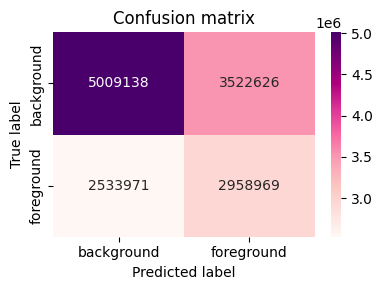

In [ ]:
#report_1 = model_classification_report(model_1, test_loader_1, DEVICE, NUM_CLASES)
acc, rep, cm = model_segmentation_report(
    model_1_2, test_loader_1, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

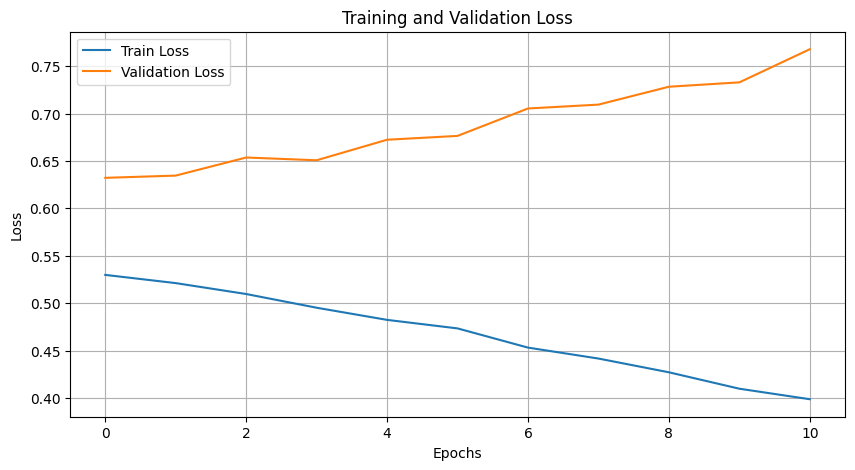

In [ ]:
plot_training(epoch_train_errors_1_2, epoch_val_errors_1_2)

### Observaciones

En esta primera prueba con la U-Net original vimos que el modelo prácticamente no aprende a detectar a la persona. Tiende a marcar casi todo como background y el Dice queda muy bajo. Además, la loss baja muy despacio y no muestra señales de mejora real, mostrandose sobre el final un gran sobreajuste.

## UNet con padding 1

La idea de esto es simplificar la arquitectura manteniendo el tamaño de las imagenes para mantener mas información de la imagen en cada capa y no tener que hacer un resize en la parte del decoder, pudiendo simplemente concatenar los feature maps.

In [ ]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders(
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=base_img_tf_byn,
                                                            train_transform_mask=base_mask_tf_byn,
                                                            val_transform_img=base_img_tf_byn,
                                                            val_transform_mask=base_mask_tf_byn)

In [140]:
unet_pad_1 = UNet(n_class=1, padding=1).to(DEVICE)
criterion_pad_1 = nn.BCEWithLogitsLoss()
optimizer_pad_1  = torch.optim.Adam(unet_pad_1.parameters(), lr=1e-5)

epoch_train_errors_pad_1, epoch_val_errors_pad_1 = train(unet_pad_1, optimizer_pad_1, criterion_pad_1,
                                                 train_loader_pad, val_loader_pad, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=100, log_every=10)

Epoch: 002 | Train Loss: 0.65953 | Val Loss: 0.62329
Epoch: 010 | Train Loss: 0.50128 | Val Loss: 0.45910
Epoch: 020 | Train Loss: 0.42229 | Val Loss: 0.39328
Epoch: 030 | Train Loss: 0.38674 | Val Loss: 0.36211
Epoch: 040 | Train Loss: 0.35059 | Val Loss: 0.33363
Epoch: 050 | Train Loss: 0.31471 | Val Loss: 0.32260
Epoch: 060 | Train Loss: 0.27657 | Val Loss: 0.31501
Epoch: 070 | Train Loss: 0.22550 | Val Loss: 0.32787
Detener entrenamiento en la época 73, la mejor pérdida fue 0.31364


Accuracy: 0.8695
Dice: 0.7995


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona        0.9         0.89         0.89       83232184.0             
persona          0.83         0.84         0.84       53727816.0             
accuracy                                   0.87                              
macro avg        0.86         0.86         0.86      136960000.0      0.8    
weighted avg     0.87         0.87         0.87      136960000.0      0.8    
1                                                                     0.8    



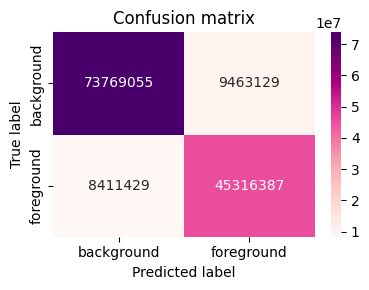

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_pad_1, test_loader_pad, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

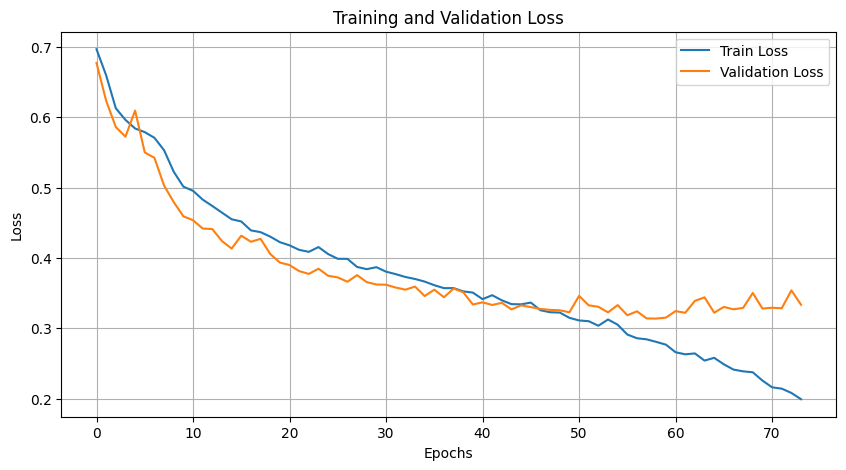

In [142]:
plot_training(epoch_train_errors_pad_1, epoch_val_errors_pad_1)

In [ ]:
predict_and_build_submission(unet_pad_1, DEVICE, kaggle_loader_pad, out_csv="unet_padding_1_submission")

submission guardado como: submissions/unet_padding_1_submission_16-11-2025_20:01.csv


(           id                                     encoded_pixels
 0    1024.png  71168 1 71965 7 72761 11 73559 13 74356 16 751...
 1    1025.png  672 129 1472 129 2270 131 3069 132 3868 133 46...
 2    1027.png  180714 23 181506 38 182300 50 183094 61 183888...
 3    1037.png  5747 14 6545 20 7343 25 8142 33 8209 28 8941 3...
 4    1038.png  27976 3 28774 7 29574 8 30374 9 31173 11 31973...
 ..        ...                                                ...
 529   971.png  103886 1 104682 9 105480 15 106278 20 107077 2...
 530   975.png  5032 8 5827 18 6624 23 7421 29 8218 33 8961 8 ...
 531   987.png  18879 4 19677 11 20476 15 21275 19 22076 19 22...
 532   995.png  344 143 1144 143 1942 147 2741 149 3540 151 43...
 533   999.png  190386 6 191182 13 191979 19 192776 25 193573 ...
 
 [534 rows x 2 columns],
 'submissions/unet_padding_1_submission_16-11-2025_20:01.csv')

### Observaciones 
Con la U-Net usando padding 1 y entrenando muchas más épocas el cambio fue enorme. La loss de train y de validación bajan de forma significativa. El accuracy sube a ~0.87 y el Dice ronda 0.8. En el reporte de clasificación se ve que tanto la clase persona como no-persona tienen precision y recall altos y bastante balanceados, y la matriz de confusión muestra que el modelo ya no se queda pegado al background como antes. Hay una pequeña separación entre la curva de train y la de validación al final, que sugiere un poco de overfitting, pero en general este setup con padding=1 y más épocas nos da una U-Net mucho más razonable como baseline.

### Prueba de combined_loss

En esta prueba cambiamos dos cosas importantes: aumentamos el learning rate y reemplazamos la pérdida clásica por nuestra combined loss.
La idea era ver si una tasa de aprendizaje un poco más grande ayudaba al modelo a bajar la loss más rápido y si la combinación de BCE + Dice aportaba una señal de entrenamiento más informativa.

El resultado fue bastante positivo. La loss cayó mucho más rápido que en los experimentos anteriores y el early stopping se activó antes porque el modelo llegó a una buena pérdida en menos épocas. Esto muestra que el LR más alto no desestabilizó el entrenamiento y que la combined loss ayudó a que la red aprendiera la forma de la persona de manera más eficiente.

In [ ]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders(batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=base_img_tf_byn,
                                                            train_transform_mask=base_mask_tf_byn,
                                                            val_transform_img=base_img_tf_byn,
                                                            val_transform_mask=base_mask_tf_byn)

In [40]:
unet_pad_1_1 = UNet(n_class=1, padding=1).to(DEVICE)
criterion_pad_1_1 = combined_loss
optimizer_pad_1_1  = torch.optim.Adam(unet_pad_1_1.parameters(), lr=1e-4)

epoch_train_errors_pad_1_1, epoch_val_errors_pad_1_1 = train(unet_pad_1_1, optimizer_pad_1_1, criterion_pad_1_1,
                                                 train_loader_pad, val_loader_pad, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=100, log_every=5,
                                                checkpoint_path="models/unet_pad_1_1.pth", loss_ponderada=True)

Epoch: 002 | Train Loss: 0.47095 | Val Loss: 0.47347
Epoch: 005 | Train Loss: 0.36873 | Val Loss: 0.39898
Epoch: 010 | Train Loss: 0.25649 | Val Loss: 0.27531
Epoch: 015 | Train Loss: 0.16081 | Val Loss: 0.24208
Epoch: 020 | Train Loss: 0.06119 | Val Loss: 0.28227
Detener entrenamiento en la época 23, la mejor pérdida fue 0.23616


Accuracy: 0.8977
Dice: 0.8423


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.92         0.91         0.92       8522061.0              
persona          0.86         0.88         0.87       5502643.0              
accuracy                                    0.9                              
macro avg        0.89          0.9         0.89      14024704.0      0.84    
weighted avg      0.9          0.9          0.9      14024704.0      0.84    
1                                                                    0.84    



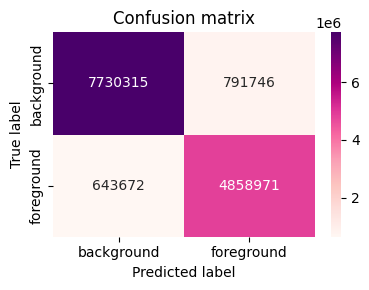

In [41]:
acc, rep, cm = model_segmentation_report(
    unet_pad_1_1, test_loader_pad, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

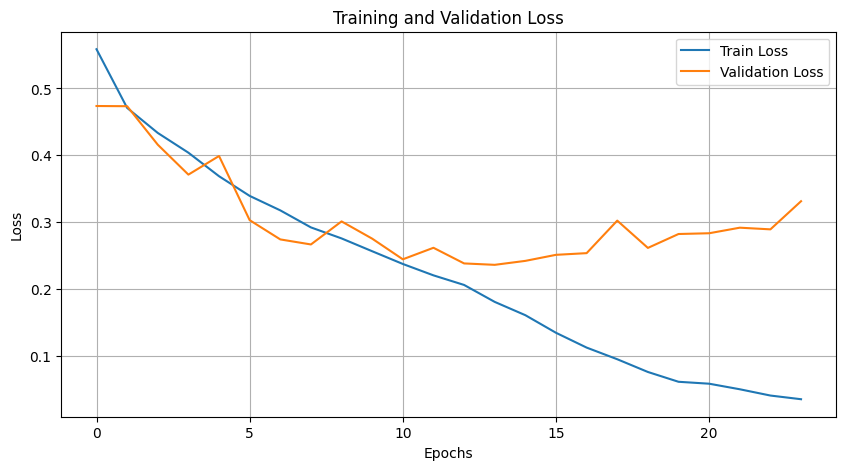

In [42]:
plot_training(epoch_train_errors_pad_1_1, epoch_val_errors_pad_1_1)

In [ ]:
predict_and_build_submission(unet_pad_1_1, DEVICE, kaggle_loader_pad, out_csv="unet_padding_1_1_submission")

submission guardado como: submissions/unet_padding_1_1_submission_19-11-2025_00:51.csv


(           id                                     encoded_pixels
 0    1024.png  193170 13 193925 62 194725 62 195524 64 196325...
 1    1025.png  163671 1 164470 3 165269 6 166068 7 166867 9 1...
 2    1027.png  176728 16 177522 26 178316 36 179112 42 179904...
 3    1037.png  136679 11 137474 20 138270 37 139067 49 139864...
 4    1038.png  55874 1 56671 6 57472 5 58273 4 59074 2 59873 ...
 ..        ...                                                ...
 529   971.png  51999 2 52799 2 53598 3 54397 4 55197 4 55997 ...
 530   975.png  593 9 1393 9 2193 10 2993 11 3793 12 4592 15 5...
 531   987.png  474 103 1274 103 2073 104 2872 106 3672 106 44...
 532   995.png  339 77 1139 77 1938 78 2737 79 3537 79 4336 80...
 533   999.png  169558 2 170354 14 171151 21 171949 26 172747 ...
 
 [534 rows x 2 columns],
 'submissions/unet_padding_1_1_submission_19-11-2025_00:51.csv')

In [ ]:
predict_and_build_submission(unet_pad_1_1, DEVICE, kaggle_loader_pad, out_csv="unet_padding_1_1_submission")

submission guardado como: submissions/unet_padding_1_1_submission_19-11-2025_00:51.csv


(           id                                     encoded_pixels
 0    1024.png  193170 13 193925 62 194725 62 195524 64 196325...
 1    1025.png  163671 1 164470 3 165269 6 166068 7 166867 9 1...
 2    1027.png  176728 16 177522 26 178316 36 179112 42 179904...
 3    1037.png  136679 11 137474 20 138270 37 139067 49 139864...
 4    1038.png  55874 1 56671 6 57472 5 58273 4 59074 2 59873 ...
 ..        ...                                                ...
 529   971.png  51999 2 52799 2 53598 3 54397 4 55197 4 55997 ...
 530   975.png  593 9 1393 9 2193 10 2993 11 3793 12 4592 15 5...
 531   987.png  474 103 1274 103 2073 104 2872 106 3672 106 44...
 532   995.png  339 77 1139 77 1938 78 2737 79 3537 79 4336 80...
 533   999.png  169558 2 170354 14 171151 21 171949 26 172747 ...
 
 [534 rows x 2 columns],
 'submissions/unet_padding_1_1_submission_19-11-2025_00:51.csv')

### Prueba con combined_loss_edge y learning rate scheduler

Esta prueba la hicimos luego de haber implementado esta nueva loss, para ver si mejoraba el resultado de la unet en blanco y negro.

In [ ]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=base_img_tf_byn,
                                                            train_transform_mask=base_mask_tf_byn,
                                                            val_transform_img=base_img_tf_byn,
                                                            val_transform_mask=base_mask_tf_byn)

unet_byn = UNet(n_class=1, padding=1, use_bn=True, dropout=0.3).to(DEVICE)
criterion_byn = combined_loss_edge
optimizer_byn = torch.optim.Adam(unet_byn.parameters(), lr=1e-3, weight_decay=1e-5) 
scheduler_byn = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_byn, mode="min", factor=0.5, patience=4)

epoch_train_errors_byn, epoch_val_errors_byn = train(unet_byn, optimizer_byn, criterion_byn,
                                                 train_loader_pad, val_loader_pad, DEVICE, scheduler=scheduler_byn,
                                                 do_early_stopping=True, patience=10, epochs=150, log_every=5,
                                                checkpoint_path="models/unet_byn.pth", loss_ponderada=False)

Epoch: 002 | Train Loss: 0.50858 | Val Loss: 0.49771 | Current LR: 0.00100
Epoch: 005 | Train Loss: 0.44395 | Val Loss: 0.38936 | Current LR: 0.00100
Epoch: 010 | Train Loss: 0.37122 | Val Loss: 0.30848 | Current LR: 0.00100
Epoch: 015 | Train Loss: 0.32933 | Val Loss: 0.27102 | Current LR: 0.00100
Epoch: 020 | Train Loss: 0.31615 | Val Loss: 0.28254 | Current LR: 0.00100
Epoch: 025 | Train Loss: 0.30221 | Val Loss: 0.24496 | Current LR: 0.00100
Epoch: 030 | Train Loss: 0.28406 | Val Loss: 0.24697 | Current LR: 0.00100
Epoch: 035 | Train Loss: 0.26972 | Val Loss: 0.22967 | Current LR: 0.00100
Epoch: 040 | Train Loss: 0.26414 | Val Loss: 0.21169 | Current LR: 0.00100
Epoch: 045 | Train Loss: 0.25834 | Val Loss: 0.22213 | Current LR: 0.00100
Epoch: 050 | Train Loss: 0.25059 | Val Loss: 0.20922 | Current LR: 0.00100
Epoch: 055 | Train Loss: 0.24191 | Val Loss: 0.20162 | Current LR: 0.00100
Epoch: 060 | Train Loss: 0.22216 | Val Loss: 0.18581 | Current LR: 0.00050
Epoch: 065 | Train Loss: 

Accuracy: 0.9446
Dice: 0.9099


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.97         0.94         0.95       8531764.0              
persona          0.91         0.95         0.93       5492940.0              
accuracy                                   0.94                              
macro avg        0.94         0.95         0.94      14024704.0      0.91    
weighted avg     0.95         0.94         0.94      14024704.0      0.91    
1                                                                    0.91    



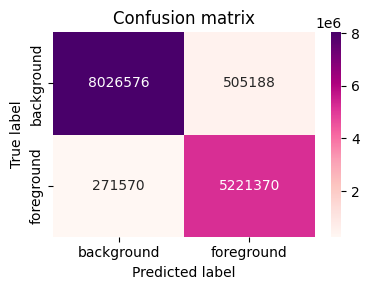

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_byn, test_loader_pad, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

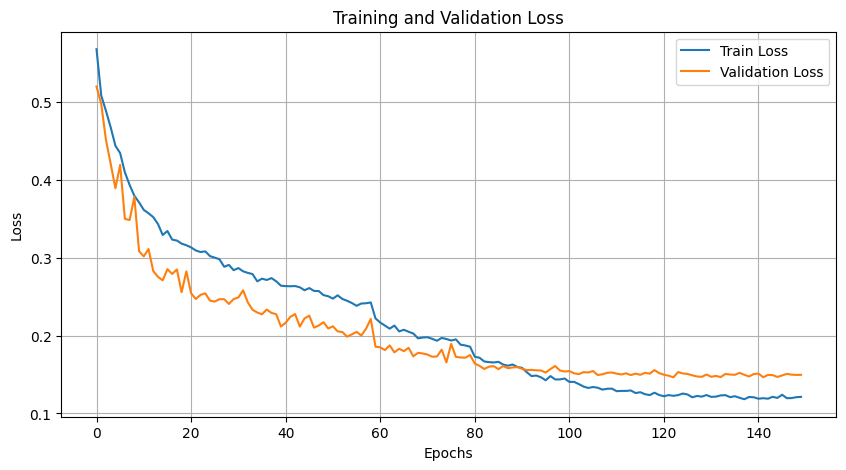

In [ ]:
plot_training(epoch_train_errors_byn, epoch_val_errors_byn)

### Observaciones

Podemos ver como la pérdida bajó mas rápido y la validación acompañó bastante bien al principio. Después de varias épocas se empezó a notar un poco de overfitting, vemos como el train siguió bajando pero la validación quedó más estable o incluso subió un poco. Aun así, los resultados finales son muy buenos, la accuracy y el dice mejoraron bastante y las dos clases quedaron mucho más equilibradas en precisión y recall. En resumen, se obtuvo un entrenamiento más rápido y métricas más sólidas sin necesidad de complicar la arquitectura.


## UNet con padding 1 + RGB

Probamos la misma arquitectura pero usando imágenes RGB en lugar de escala de grises. La motivación es que las imágenes en color contienen más información, además de la intensidad, aportan variaciones de tono y saturación que ayudan mucho a distinguir bordes, texturas y detalles finos del cuerpo humano. Al darle al modelo tres canales en lugar de uno, la U-Net puede aprender mas patrones, ayudando a separar mejor la persona del background, especialmente en zonas donde el contraste en blanco y negro no alcanza.


In [ ]:
train_loader_rgb, val_loader_rgb, test_loader_rgb, kaggle_loader_rgb = get_seg_dataloaders(
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=base_mask_tf)

In [49]:
unet_rgb = UNet(n_class=1, n_channels=3, padding=1).to(DEVICE)
criterion_rgb = combined_loss
optimizer_rgb  = torch.optim.Adam(unet_rgb.parameters(), lr=1e-4)
 
epoch_train_errors_rgb, epoch_val_errors_rgb = train(unet_rgb, optimizer_rgb, criterion_rgb,
                                                 train_loader_rgb, val_loader_rgb, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=100, log_every=5,
                                                checkpoint_path="models/unet_rgb.pth", loss_ponderada=True)

Epoch: 002 | Train Loss: 0.43594 | Val Loss: 0.44050
Epoch: 005 | Train Loss: 0.35370 | Val Loss: 0.37336
Epoch: 010 | Train Loss: 0.26023 | Val Loss: 0.27474
Epoch: 015 | Train Loss: 0.18822 | Val Loss: 0.25338
Epoch: 020 | Train Loss: 0.08748 | Val Loss: 0.26445
Epoch: 025 | Train Loss: 0.03734 | Val Loss: 0.33425
Detener entrenamiento en la época 27, la mejor pérdida fue 0.25157


Accuracy: 0.8873
Dice: 0.8321


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.92         0.89         0.91       8531764.0              
persona          0.84         0.88         0.86       5492940.0              
accuracy                                   0.89                              
macro avg        0.88         0.89         0.88      14024704.0      0.83    
weighted avg     0.89         0.89         0.89      14024704.0      0.83    
1                                                                    0.83    



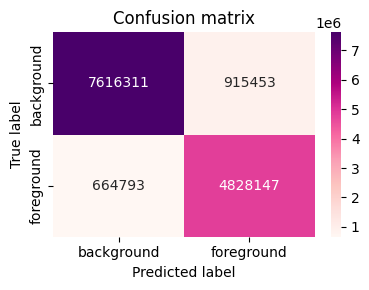

In [50]:
acc, rep, cm = model_segmentation_report(
    unet_rgb, test_loader_rgb, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

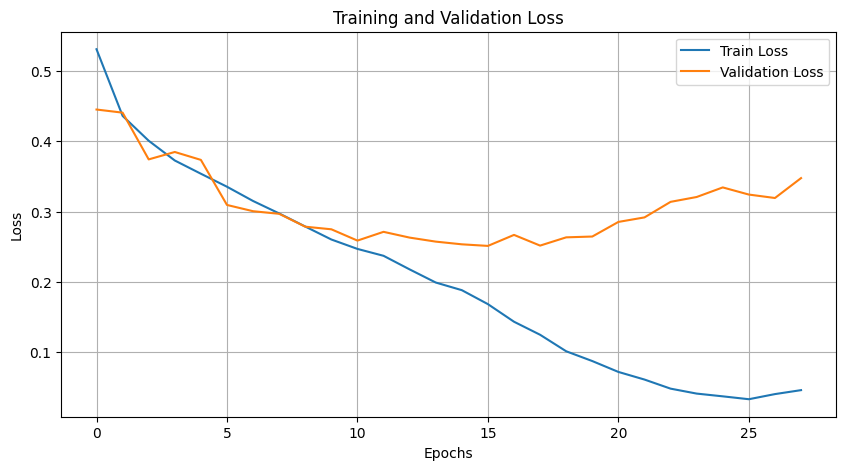

In [51]:
plot_training(epoch_train_errors_rgb, epoch_val_errors_rgb)

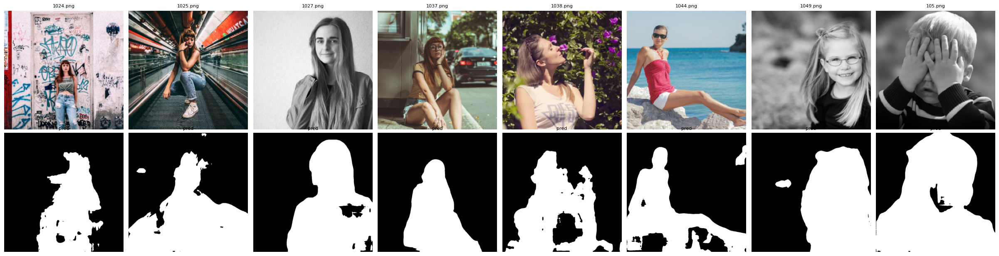

In [ ]:
visualizar_test(unet_rgb, kaggle_loader_rgb, DEVICE, MEAN_RGB, STD_RGB, n=10, threshold=0.5)

###  Observaciones
Aunque el modelo en RGB no mejoró el Dice respecto a la versión en blanco y negro (0.83 vs 0.84), sin embargo decidimos seguir trabajando sobre esta variante. La idea es ajustar mejor la arquitectura y la regularización para que realmente pueda explotar la información de color y ver si, con una U-Net más robusta, el uso de RGB termina teniendo un impacto positivo en la segmentación.

### Batch nomalization y dropout

Probamos nuevamente la misma arquitectura en RGB, pero esta vez activando Batch Normalization y agregando dropout moderado (0.3). La idea era darle más estabilidad al entrenamiento y evitar sobreajuste.

Si bien en estas próximas secciones tenemos dropout aplicado luego de **cada** convolución, más adelante nos damos cuenta de que este no es el approach más correcto y modificamos este comportamiento.

In [ ]:
train_loader_rgb_2, val_loader_rgb_2, test_loader_rgb_2, kaggle_loader_rgb_2 = get_seg_dataloaders(
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=base_mask_tf)

In [54]:
unet_rgb_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)
criterion_rgb_2 = combined_loss
optimizer_rgb_2 = torch.optim.Adam(unet_rgb_2.parameters(), lr=1e-4)
 
epoch_train_errors_rgb_2, epoch_val_errors_rgb_2 = train(unet_rgb_2, optimizer_rgb_2, criterion_rgb_2,
                                                 train_loader_rgb_2, val_loader_rgb_2, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=100, log_every=5,
                                                checkpoint_path="models/unet_rgb_2.pth", loss_ponderada=True)

Epoch: 002 | Train Loss: 0.46701 | Val Loss: 0.65348
Epoch: 005 | Train Loss: 0.42590 | Val Loss: 0.62397
Epoch: 010 | Train Loss: 0.37281 | Val Loss: 0.35292
Epoch: 015 | Train Loss: 0.34408 | Val Loss: 0.30161
Epoch: 020 | Train Loss: 0.31696 | Val Loss: 0.26136
Epoch: 025 | Train Loss: 0.28826 | Val Loss: 0.23998
Epoch: 030 | Train Loss: 0.27002 | Val Loss: 0.22849
Epoch: 035 | Train Loss: 0.25630 | Val Loss: 0.21406
Epoch: 040 | Train Loss: 0.24291 | Val Loss: 0.20221
Epoch: 045 | Train Loss: 0.22954 | Val Loss: 0.20433
Epoch: 050 | Train Loss: 0.21742 | Val Loss: 0.18524
Epoch: 055 | Train Loss: 0.20740 | Val Loss: 0.18525
Epoch: 060 | Train Loss: 0.19598 | Val Loss: 0.17094
Epoch: 065 | Train Loss: 0.18957 | Val Loss: 0.17060
Epoch: 070 | Train Loss: 0.18015 | Val Loss: 0.16087
Epoch: 075 | Train Loss: 0.16976 | Val Loss: 0.16053
Epoch: 080 | Train Loss: 0.16369 | Val Loss: 0.15770
Epoch: 085 | Train Loss: 0.15458 | Val Loss: 0.15459
Detener entrenamiento en la época 88, la mejor

Accuracy: 0.9296
Dice: 0.8907


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.96         0.92         0.94       8531764.0              
persona          0.88         0.95         0.91       5492940.0              
accuracy                                   0.93                              
macro avg        0.92         0.93         0.93      14024704.0      0.89    
weighted avg     0.93         0.93         0.93      14024704.0      0.89    
1                                                                    0.89    



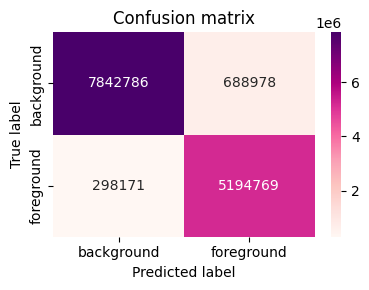

In [55]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_2, test_loader_rgb_2, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

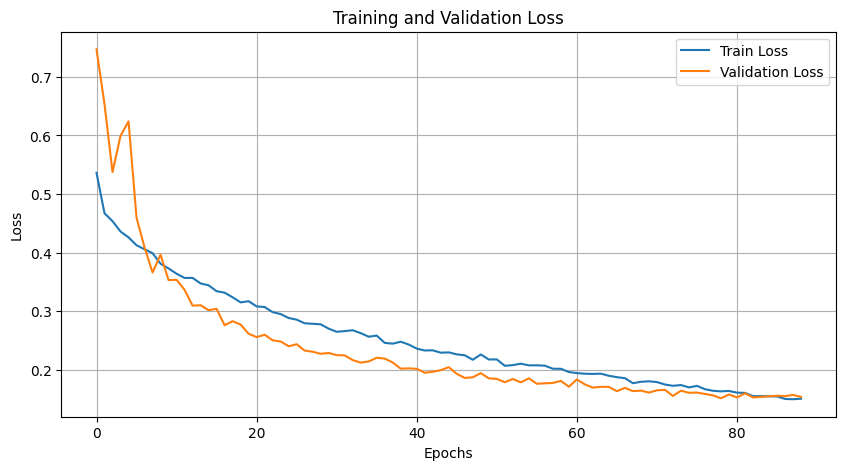

In [56]:
plot_training(epoch_train_errors_rgb_2, epoch_val_errors_rgb_2)

In [98]:
unet_rgb_2 = dice_on_val_with_postproc(unet_rgb_2, val_loader_rgb_2, DEVICE, threshold=0.6) # con clean mask v2
print("Dice val con postprocesado:", unet_rgb_2)

Dice val con postprocesado: 0.9098154650124299


### Observaciones
La combinación de RGB + BatchNorm + Dropout funcionó mucho mejor: el entrenamiento fue estable, la pérdida bajó de forma continua y no se disparó como antes. El error de validación estuvo siempre alineado con el error de entrenamiento, lo cual indica que el dropout realmente ayudó a controlar el sobreajuste.

En métricas finales se ve una mejora clara: el dice subió a 0.89, superando tanto al modelo original en B/N como al primer intento en RGB. Además, el recall de persona subió bastante, lo que quiere decir que ahora detecta mucha más superficie de la persona sin “perderla”.

Ademas, se aplico un proceso de post procesado sobre las mascara, para "limpiar" las misma, pasando de tener un dice de 0.89 a 0.9

En resumen: RGB + BN + Dropout le dio mucha más estabilidad a la U-Net y fue la primera configuración en RGB que superó a la versión en blanco y negro.



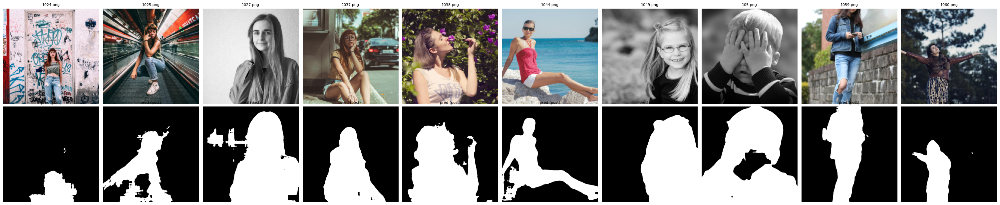

submission guardado como: submissions/unet_rgb_2_post_submission_28-11-2025_19:50.csv


(           id                                     encoded_pixels
 0    1024.png  173554 5 174352 10 175152 11 175951 14 176751 ...
 1    1025.png  648 32 1448 32 2247 33 3046 34 3845 35 4644 36...
 2    1027.png  30671 8 30697 6 31468 14 31493 13 32265 42 330...
 3    1037.png  139073 10 139870 18 140667 26 141465 51 142263...
 4    1038.png  37506 11 38304 23 39102 30 39902 32 40700 39 4...
 ..        ...                                                ...
 529   971.png  52799 2 53599 2 54398 3 55157 3 55198 3 55955 ...
 530   975.png  592 50 1392 50 2191 51 2990 53 3789 54 4588 56...
 531   987.png  473 222 1273 222 2072 223 2871 224 3671 224 44...
 532   995.png  427 179 614 126 1227 179 1414 126 2026 182 221...
 533   999.png  212691 11 213487 20 214284 25 215082 30 215878...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_2_post_submission_28-11-2025_19:50.csv')

In [ ]:
predict_and_build_submission(unet_rgb_2, DEVICE, kaggle_loader_rgb_2, out_csv="unet_rgb_2_post_submission", use_post_proc=True, debug=True, mean=MEAN_RGB, std=STD_RGB)

### Batch normalization, dropout y data augmentation

Probamos aplicar transformaciones geométricas como `RandomHorizontalFlip` y `RandomAffine`, y `ColorJitter` para brillo y contraste.

In [ ]:
train_loader_rgb_3, val_loader_rgb_3, test_loader_rgb_3, kaggle_loader_rgb_3 = get_seg_dataloaders(
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    seed=SEED,
    rgb=True,
    # Post
    train_transform_img=train_img_post_tf_rgb,
    train_transform_mask=train_mask_post_tf_rgb,
    val_transform_img=val_img_post_tf_rgb,
    val_transform_mask=val_mask_post_tf_rgb,
    # Conjuntas
    joint_transform_train=joint_transform_train_rgb,
    joint_transform_val=joint_transform_val_rgb,
)


In [117]:
unet_rgb_3 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)
criterion_rgb_3 = combined_loss
optimizer_rgb_3 = torch.optim.Adam(unet_rgb_3.parameters(), lr=1e-4)
 
epoch_train_errors_rgb_3, epoch_val_errors_rgb_3 = train(unet_rgb_3, optimizer_rgb_3, criterion_rgb_3,
                                                 train_loader_rgb_3, val_loader_rgb_3, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=100, log_every=5,
                                                checkpoint_path="models/unet_rgb_3.pth", loss_ponderada=True)

Epoch: 002 | Train Loss: 0.48394 | Val Loss: 0.48486
Epoch: 005 | Train Loss: 0.43320 | Val Loss: 0.41882
Epoch: 010 | Train Loss: 0.38444 | Val Loss: 0.34812
Epoch: 015 | Train Loss: 0.35127 | Val Loss: 0.31316
Epoch: 020 | Train Loss: 0.32303 | Val Loss: 0.28095
Epoch: 025 | Train Loss: 0.30153 | Val Loss: 0.25667
Epoch: 030 | Train Loss: 0.28101 | Val Loss: 0.24761
Epoch: 035 | Train Loss: 0.27160 | Val Loss: 0.22932
Epoch: 040 | Train Loss: 0.26358 | Val Loss: 0.21608
Epoch: 045 | Train Loss: 0.24744 | Val Loss: 0.21324
Epoch: 050 | Train Loss: 0.23859 | Val Loss: 0.20952
Epoch: 055 | Train Loss: 0.23080 | Val Loss: 0.18800
Epoch: 060 | Train Loss: 0.22204 | Val Loss: 0.19615
Epoch: 065 | Train Loss: 0.21550 | Val Loss: 0.17917
Epoch: 070 | Train Loss: 0.21020 | Val Loss: 0.18179
Epoch: 075 | Train Loss: 0.20127 | Val Loss: 0.16922
Epoch: 080 | Train Loss: 0.19612 | Val Loss: 0.16155
Epoch: 085 | Train Loss: 0.19247 | Val Loss: 0.16117
Epoch: 090 | Train Loss: 0.18359 | Val Loss: 0

Accuracy: 0.9261
Dice: 0.8872


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.97         0.91         0.94       8531764.0              
persona          0.87         0.96         0.91       5492940.0              
accuracy                                   0.93                              
macro avg        0.92         0.93         0.92      14024704.0      0.89    
weighted avg     0.93         0.93         0.93      14024704.0      0.89    
1                                                                    0.89    



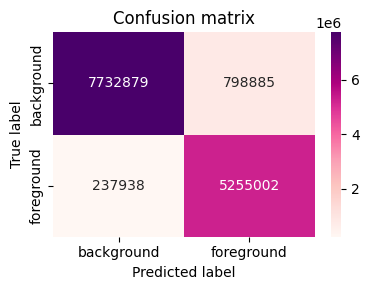

In [118]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_3, test_loader_rgb_3, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

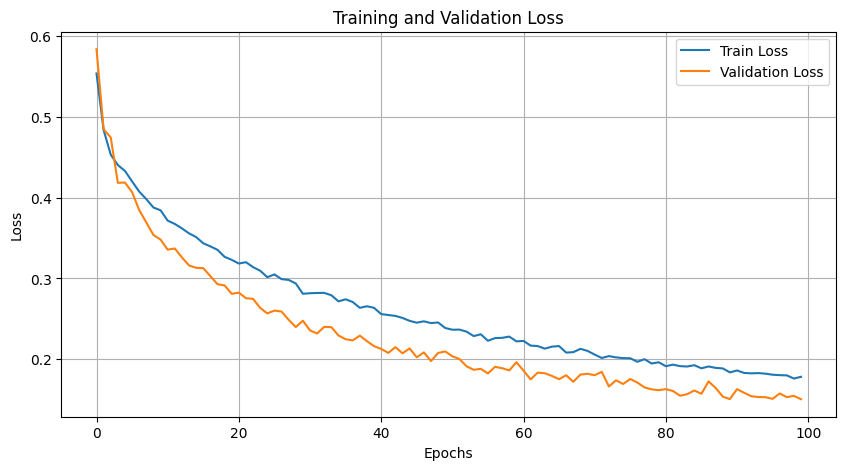

In [119]:
plot_training(epoch_train_errors_rgb_3, epoch_val_errors_rgb_3)

In [121]:
unet_rgb_3_post = dice_on_val_with_postproc(unet_rgb_3, val_loader_rgb_3, DEVICE, threshold=0.6) # con clean mask v2
print("Dice val con postprocesado:", unet_rgb_3_post)

Dice val con postprocesado: 0.9070637734995491


In [ ]:
predict_and_build_submission(unet_rgb_3, DEVICE, kaggle_loader_rgb_3, out_csv="unet_rgb_att_3_ubmission", use_post_proc=True)

submission guardado como: submissions/unet_rgb_att_3_ubmission_20-11-2025_04:32.csv


(           id                                     encoded_pixels
 0    1024.png  193567 15 194367 17 195166 21 195967 24 196767...
 1    1025.png  647 57 1446 59 2246 59 3046 59 3846 59 4645 61...
 2    1027.png  177536 14 178330 25 179125 33 179920 40 180715...
 3    1037.png  137478 10 138274 18 139070 25 139868 32 140665...
 4    1038.png  685 46 1485 46 2286 45 3086 46 3886 46 4686 46...
 ..        ...                                                ...
 529   971.png  63953 3 64746 11 65544 13 66341 17 67136 22 67...
 530   975.png  584 66 1383 67 2183 67 2983 68 3783 68 4582 69...
 531   987.png  471 234 1271 234 2070 235 2870 235 3670 234 44...
 532   995.png  382 386 1181 387 1981 387 2781 388 3581 387 43...
 533   999.png  213492 8 214286 20 215083 26 215880 32 216677 ...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_att_3_ubmission_20-11-2025_04:32.csv')

### Batch normalization, dropout y crop transform

En esta sección probamos usar solamente el crop de imagen que definimos en la sección de Transforms que detecta la persona y recorta esa zona con centro en ella.

In [ ]:
joint_transform_train = make_crop_transform_train(p=0.3)

train_loader_crop, val_loader_crop, test_loader_crop, kaggle_loader_crop = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,
    joint_transform_train=joint_transform_train,
   
)

unet_crop = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)
criterion_crop = combined_loss


optimizer = torch.optim.Adam(unet_crop.parameters(), lr=0.004, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=2
)


model, _, checkpoint = restaurar_modelo(unet_crop, None, "models/unet_rgb_2.pth", DEVICE)
 
epoch_train_errors_rgb_22, epoch_val_errors_rgb_22 = train(
    unet_crop, optimizer, criterion_crop, train_loader_crop, val_loader_crop, DEVICE, scheduler=scheduler,
    do_early_stopping=False, patience=10, epochs=120, log_every=1
)

Epoch: 001 | Train Loss: 0.52853 | Val Loss: 0.47793 | Current LR: 0.00400
Epoch: 002 | Train Loss: 0.48506 | Val Loss: 0.43827 | Current LR: 0.00400
Epoch: 003 | Train Loss: 0.47543 | Val Loss: 0.44185 | Current LR: 0.00400
Epoch: 004 | Train Loss: 0.45999 | Val Loss: 0.42411 | Current LR: 0.00400
Epoch: 005 | Train Loss: 0.45392 | Val Loss: 0.41774 | Current LR: 0.00400
Epoch: 006 | Train Loss: 0.45245 | Val Loss: 0.42639 | Current LR: 0.00400
Epoch: 007 | Train Loss: 0.44668 | Val Loss: 0.40493 | Current LR: 0.00400
Epoch: 008 | Train Loss: 0.43375 | Val Loss: 0.40704 | Current LR: 0.00400
Epoch: 009 | Train Loss: 0.43909 | Val Loss: 0.41088 | Current LR: 0.00400
Epoch: 010 | Train Loss: 0.43056 | Val Loss: 0.39480 | Current LR: 0.00400
Epoch: 011 | Train Loss: 0.42331 | Val Loss: 0.39666 | Current LR: 0.00400
Epoch: 012 | Train Loss: 0.42202 | Val Loss: 0.39568 | Current LR: 0.00400
Epoch: 013 | Train Loss: 0.41750 | Val Loss: 0.41288 | Current LR: 0.00200
Epoch: 014 | Train Loss: 

Accuracy: 0.9209
Dice: 0.8772


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.96          0.9         0.93       8531764.0              
persona          0.86         0.95          0.9       5492940.0              
accuracy                                   0.92                              
macro avg        0.91         0.93         0.92      14024704.0      0.88    
weighted avg     0.92         0.92         0.92      14024704.0      0.88    
1                                                                    0.88    



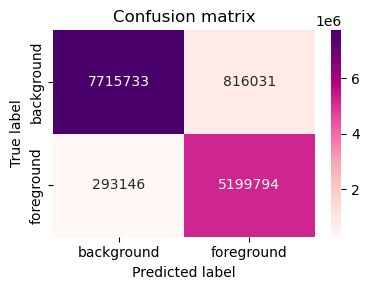

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_crop, test_loader_crop, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

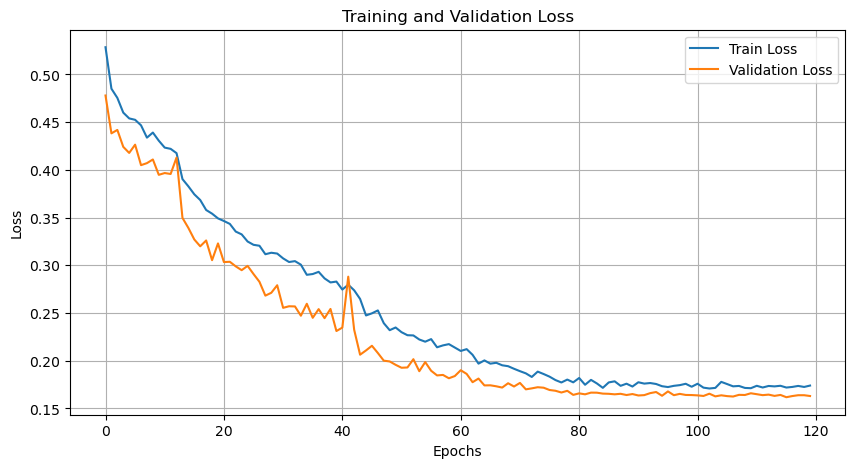

In [ ]:
plot_training(epoch_train_errors_rgb_22, epoch_val_errors_rgb_22)

## UNet con dropout solo en capas profundas

En las pruebas anteriores con dropout, estabamos aplicandolo con una probabilidad de 0.3 luego de **cada** convolucion.

Decidimos probar con distintas probabilidades y aplicando solamente a partir de capas profundas.

In [ ]:
train_loader, val_loader, test_loader, kaggle_loader = get_seg_dataloaders(
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=base_mask_tf)

In [ ]:
model4 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.2, deep_channels=512).to(DEVICE)
criterion = combined_loss_edge
optimizer = torch.optim.Adam(model4.parameters(), lr=0.001, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=4
)

epoch_train_errors, epoch_val_errors = train(
    model4,
    optimizer,
    criterion,
    train_loader,
    val_loader,
    DEVICE,
    do_early_stopping=True,
    patience=10,
    epochs=100,        # solo las épocas nuevas
    log_every=5,
    checkpoint_path="models/unet_drop_03.pth",
    save_optimizer=True,
    loss_ponderada=False,
    scheduler=scheduler
)


Epoch: 002 | Train Loss: 0.44845 | Val Loss: 0.49822 | Current LR: 0.00100
Epoch: 005 | Train Loss: 0.36500 | Val Loss: 0.33744 | Current LR: 0.00100
Epoch: 010 | Train Loss: 0.28884 | Val Loss: 0.31082 | Current LR: 0.00100
Epoch: 015 | Train Loss: 0.25107 | Val Loss: 0.23670 | Current LR: 0.00100
Epoch: 020 | Train Loss: 0.21611 | Val Loss: 0.20707 | Current LR: 0.00100
Epoch: 025 | Train Loss: 0.19513 | Val Loss: 0.29027 | Current LR: 0.00100
Epoch: 030 | Train Loss: 0.14535 | Val Loss: 0.16825 | Current LR: 0.00050
Epoch: 035 | Train Loss: 0.12657 | Val Loss: 0.16030 | Current LR: 0.00050
Epoch: 040 | Train Loss: 0.11370 | Val Loss: 0.15029 | Current LR: 0.00050
Epoch: 045 | Train Loss: 0.08073 | Val Loss: 0.14181 | Current LR: 0.00025
Epoch: 050 | Train Loss: 0.07645 | Val Loss: 0.16207 | Current LR: 0.00013
Epoch: 055 | Train Loss: 0.05839 | Val Loss: 0.14833 | Current LR: 0.00013
Epoch: 060 | Train Loss: 0.04997 | Val Loss: 0.14410 | Current LR: 0.00006
Epoch: 065 | Train Loss: 

Accuracy: 0.9506
Dice: 0.9247


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.97         0.95         0.96       8531764.0              
persona          0.93         0.95         0.94       5492940.0              
accuracy                                   0.95                              
macro avg        0.95         0.95         0.95      14024704.0      0.92    
weighted avg     0.95         0.95         0.95      14024704.0      0.92    
1                                                                    0.92    



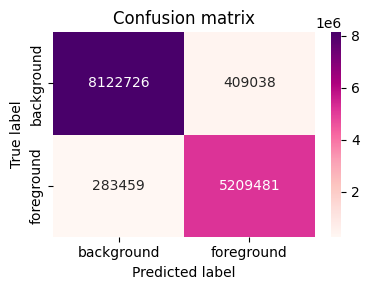

In [ ]:
acc, rep, cm = model_segmentation_report(
    model4, test_loader, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

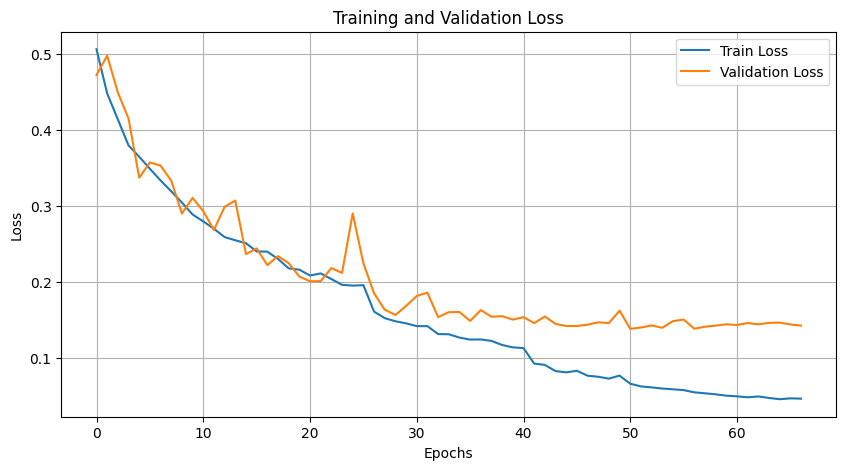

In [ ]:
plot_training(epoch_train_errors, epoch_val_errors)

## Residual UNet

In [ ]:
train_loader_res, val_loader_res, test_loader_res, kaggle_loader_res = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,

)

unet_res = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, use_res=True).to(DEVICE)
criterion_res = combined_loss_edge


optimizer = torch.optim.Adam(unet_res.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)


epoch_train_errors_res, epoch_val_errors_res = train(
    unet_res, optimizer, criterion_res, train_loader_res, test_loader_res, DEVICE, scheduler=scheduler,
    do_early_stopping=True, patience=10, epochs=100, log_every=1,
    checkpoint_path="/content/drive/MyDrive/models/unet_res.pth", loss_ponderada=False
)

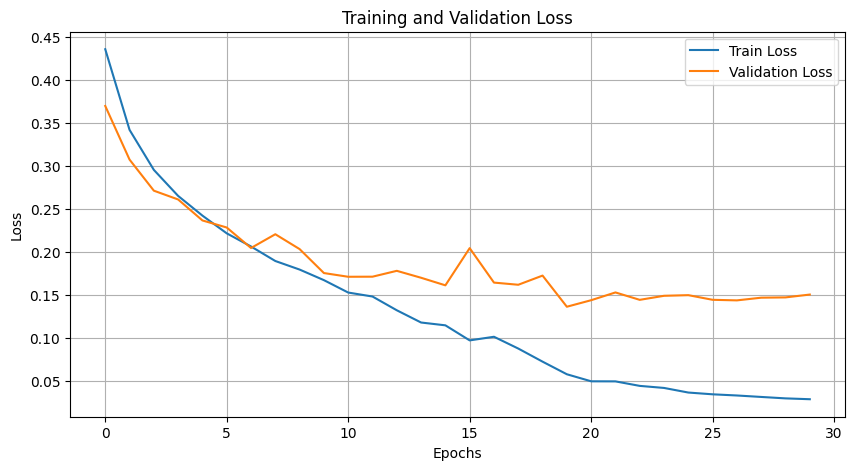

Accuracy: 0.9445
Dice: 0.9148


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.96         0.94         0.95       8531764.0              
persona          0.92         0.94         0.93       5492940.0              
accuracy                                   0.94                              
macro avg        0.94         0.94         0.94      14024704.0      0.91    
weighted avg     0.95         0.94         0.94      14024704.0      0.91    
1                                                                    0.91    



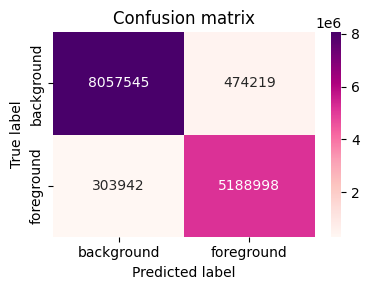

submission TTA guardado como: submissions/residual_unet_submission_27-11-2025_07:51.csv


(           id                                     encoded_pixels
 0    1024.png  262202 5 263001 7 263199 2 263800 9 263998 3 2...
 1    1025.png  82209 3 83008 4 83806 7 84605 7 85404 8 86203 ...
 2    1027.png  176731 15 177526 25 178315 40 179108 49 179902...
 3    1037.png  138303 6 139074 40 139870 54 140668 70 141464 ...
 4    1038.png  64553 7 64582 11 65346 20 65373 22 66143 53 66...
 ..        ...                                                ...
 529   971.png  41598 3 42398 3 43197 4 43997 4 44797 4 45597 ...
 530   975.png  584 59 1383 60 2183 60 2983 61 3783 61 4582 61...
 531   987.png  20553 4 21326 3 21352 7 22125 5 22150 11 22880...
 532   995.png  366190 14 366988 18 367786 23 368584 27 369382...
 533   999.png  212687 16 213484 23 214281 30 215079 35 215877...
 
 [534 rows x 2 columns],
 'submissions/residual_unet_submission_27-11-2025_07:51.csv')

In [ ]:
plot_training(epoch_train_errors_res, epoch_val_errors_res)
acc, rep, cm = model_segmentation_report(
    unet_res, test_loader_res, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)
predict_and_build_submission_tta(unet_res, DEVICE, kaggle_loader_res, out_csv="residual_unet_submission", use_post_proc=True)

## Mas convoluciones por bloque

In [ ]:
train_loader_double_res, val_loader_double_res, test_loader_double_res, kaggle_loader_double_res = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,
)

unet_double_res = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, use_res=True, double_conv=True).to(DEVICE)
criterion_double_res = combined_loss_edge


optimizer = torch.optim.Adam(unet_double_res.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)

epoch_train_errors_double_res, epoch_val_errors_double_res = train(
    unet_double_res, optimizer, criterion_double_res, train_loader_double_res, val_loader_double_res, DEVICE, scheduler=scheduler,
    do_early_stopping=True, patience=10, epochs=100, log_every=1,
    checkpoint_path="/content/drive/MyDrive/models/unet_double_res.pth", loss_ponderada=False
)

Epoch: 001 | Train Loss: 0.44683 | Val Loss: 0.35839 | Current LR: 0.0001000000
Epoch: 002 | Train Loss: 0.35587 | Val Loss: 0.35081 | Current LR: 0.0001000000
Epoch: 003 | Train Loss: 0.31276 | Val Loss: 0.29009 | Current LR: 0.0001000000
Epoch: 004 | Train Loss: 0.28186 | Val Loss: 0.27395 | Current LR: 0.0001000000
Epoch: 005 | Train Loss: 0.25313 | Val Loss: 0.23661 | Current LR: 0.0001000000
Epoch: 006 | Train Loss: 0.22859 | Val Loss: 0.25600 | Current LR: 0.0001000000
Epoch: 007 | Train Loss: 0.21204 | Val Loss: 0.21748 | Current LR: 0.0001000000
Epoch: 008 | Train Loss: 0.20045 | Val Loss: 0.22720 | Current LR: 0.0001000000
Epoch: 009 | Train Loss: 0.18571 | Val Loss: 0.18934 | Current LR: 0.0001000000
Epoch: 010 | Train Loss: 0.17892 | Val Loss: 0.15828 | Current LR: 0.0001000000
Epoch: 011 | Train Loss: 0.16788 | Val Loss: 0.18426 | Current LR: 0.0001000000
Epoch: 012 | Train Loss: 0.16094 | Val Loss: 0.17253 | Current LR: 0.0001000000
Epoch: 013 | Train Loss: 0.14619 | Val L

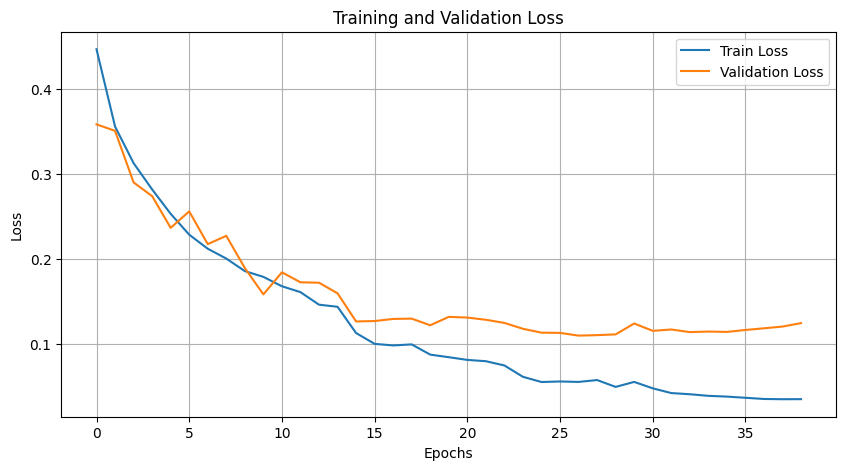

Accuracy: 0.9541
Dice: 0.9249


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.97         0.95         0.96       8531764.0              
persona          0.93         0.95         0.94       5492940.0              
accuracy                                   0.95                              
macro avg        0.95         0.95         0.95      14024704.0      0.92    
weighted avg     0.95         0.95         0.95      14024704.0      0.92    
1                                                                    0.92    



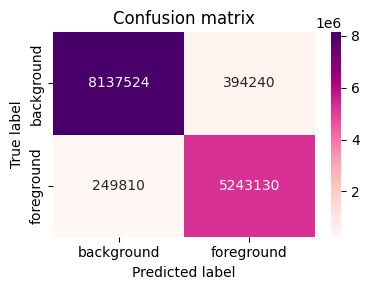

submission TTA guardado como: submissions/residual_unet_submission_27-11-2025_13:59.csv


(           id                                     encoded_pixels
 0    1024.png  269454 4 270250 12 271048 16 271845 21 272642 ...
 1    1025.png  639 24 686 20 1439 24 1486 20 2239 24 2286 21 ...
 2    1027.png  175933 10 176726 22 177521 30 178318 36 179113...
 3    1037.png  138302 8 139074 40 139870 48 140667 66 141465 ...
 4    1038.png  62952 6 62975 13 63750 42 64547 48 65345 53 66...
 ..        ...                                                ...
 529   971.png  11198 3 11995 6 12794 7 13593 8 14392 9 15190 ...
 530   975.png  586 58 1385 59 2185 59 2985 59 3785 59 4584 60...
 531   987.png  473 69 1272 70 2072 70 2872 70 3672 71 4471 72...
 532   995.png  368596 7 369391 14 370189 18 370987 21 371785 ...
 533   999.png  205583 7 206368 23 207167 25 207939 8 207966 2...
 
 [534 rows x 2 columns],
 'submissions/residual_unet_submission_27-11-2025_13:59.csv')

In [ ]:
plot_training(epoch_train_errors_double_res, epoch_val_errors_double_res)
acc, rep, cm = model_segmentation_report(
    unet_double_res, test_loader_double_res, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)
predict_and_build_submission_tta(unet_double_res, DEVICE, kaggle_loader_double_res, out_csv="residual_unet_submission", use_post_proc=True)

## Residual + Más Bloques + Dropout

In [ ]:
train_loader_double_res_drop, val_loader_double_res_drop, test_loader_double_res_drop, kaggle_loader_double_res_drop = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,
)

unet_double_res_drop = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, use_res=True, double_conv=True, dropout=0.2).to(DEVICE)
criterion_double_res_drop = combined_loss_edge


optimizer = torch.optim.Adam(unet_double_res_drop.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)

epoch_train_errors_double_res_drop, epoch_val_errors_double_res_drop = train(
    unet_double_res_drop, optimizer, criterion_double_res_drop, train_loader_double_res_drop, val_loader_double_res_drop, DEVICE, scheduler=scheduler,
    do_early_stopping=True, patience=10, epochs=100, log_every=1,
    checkpoint_path="/content/drive/MyDrive/models/unet_double_res_dropout_02.pth", loss_ponderada=False
)

Epoch: 001 | Train Loss: 0.45404 | Val Loss: 0.42344 | Current LR: 0.00010
Epoch: 002 | Train Loss: 0.36672 | Val Loss: 0.33415 | Current LR: 0.00010
Epoch: 003 | Train Loss: 0.31824 | Val Loss: 0.29896 | Current LR: 0.00010
Epoch: 004 | Train Loss: 0.28162 | Val Loss: 0.25764 | Current LR: 0.00010
Epoch: 005 | Train Loss: 0.25502 | Val Loss: 0.24681 | Current LR: 0.00010
Epoch: 006 | Train Loss: 0.23711 | Val Loss: 0.26667 | Current LR: 0.00010
Epoch: 007 | Train Loss: 0.21897 | Val Loss: 0.22498 | Current LR: 0.00010
Epoch: 008 | Train Loss: 0.20756 | Val Loss: 0.20852 | Current LR: 0.00010
Epoch: 009 | Train Loss: 0.19323 | Val Loss: 0.20806 | Current LR: 0.00010
Epoch: 010 | Train Loss: 0.18217 | Val Loss: 0.18618 | Current LR: 0.00010
Epoch: 011 | Train Loss: 0.17670 | Val Loss: 0.18343 | Current LR: 0.00010
Epoch: 012 | Train Loss: 0.16213 | Val Loss: 0.22953 | Current LR: 0.00010
Epoch: 013 | Train Loss: 0.15679 | Val Loss: 0.19080 | Current LR: 0.00010
Epoch: 014 | Train Loss: 

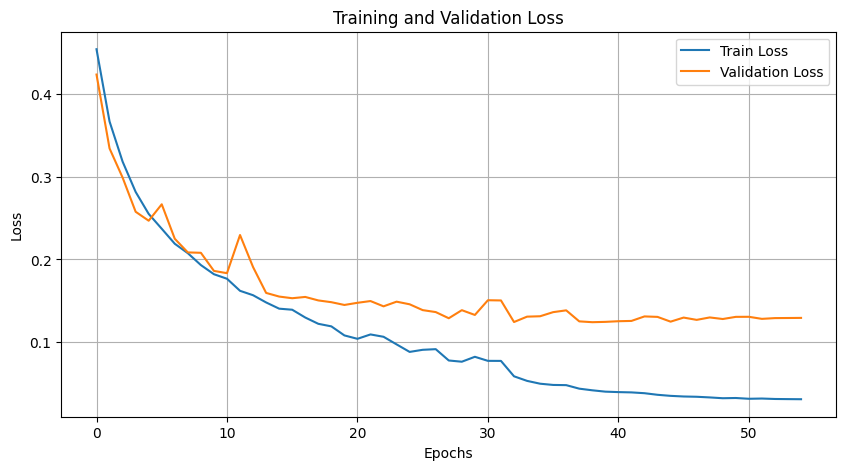

Accuracy: 0.9619
Dice: 0.9397


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.97         0.97         0.97       8531764.0              
persona          0.95         0.96         0.95       5492940.0              
accuracy                                   0.96                              
macro avg        0.96         0.96         0.96      14024704.0      0.94    
weighted avg     0.96         0.96         0.96      14024704.0      0.94    
1                                                                    0.94    



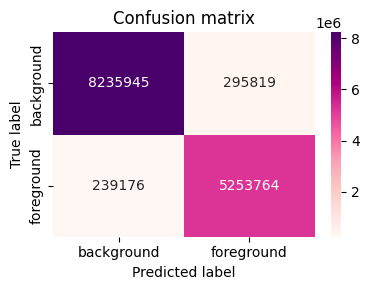

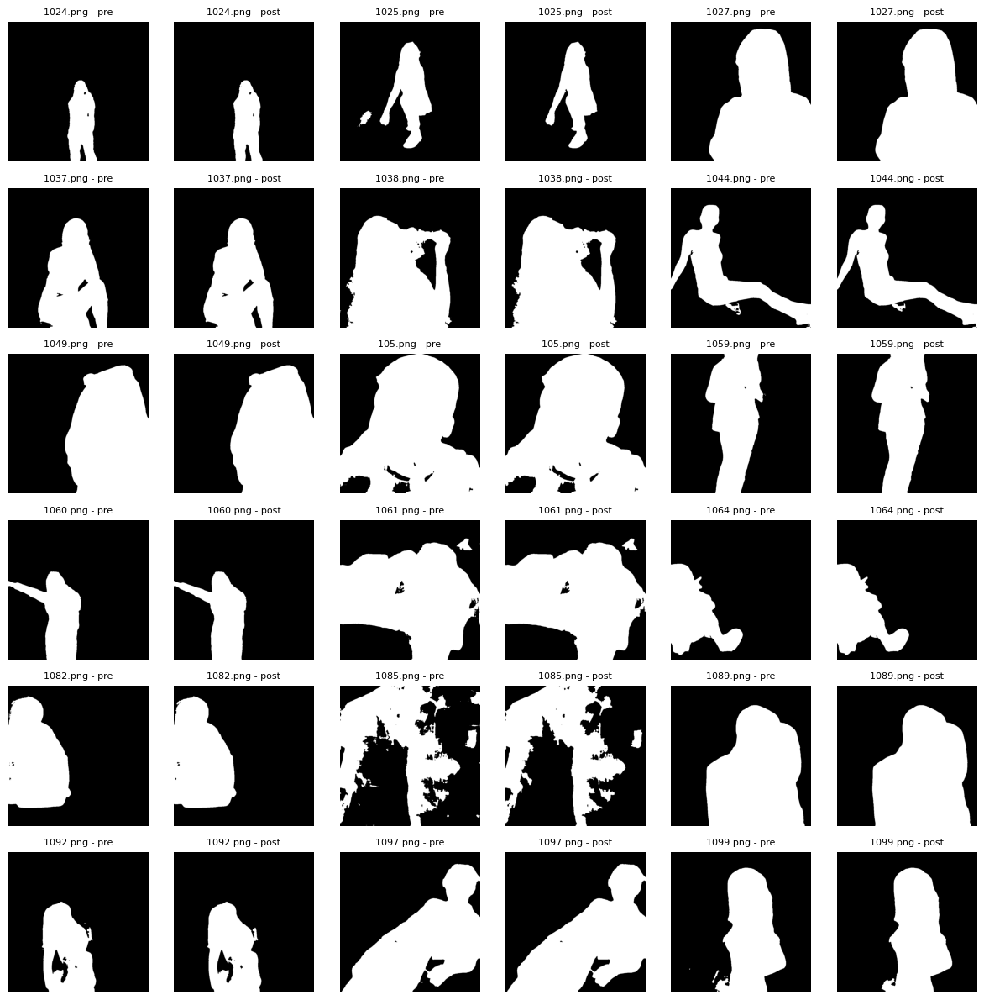

submission TTA guardado como: submissions/residual_dropout_submission_28-11-2025_18:29.csv


(           id                                     encoded_pixels
 0    1024.png  270251 12 271047 19 271845 22 272474 3 272642 ...
 1    1025.png  182967 8 183764 12 184561 16 185358 20 186155 ...
 2    1027.png  175126 17 175921 28 176716 36 177512 42 178304...
 3    1037.png  135888 23 136682 32 137474 43 138271 51 139068...
 4    1038.png  30155 8 30396 3 30954 9 31196 5 31753 11 31995...
 ..        ...                                                ...
 529   971.png  6396 5 7195 6 7995 6 8794 7 9593 8 10392 9 111...
 530   975.png  584 64 1384 64 2183 65 2982 65 3781 66 4580 66...
 531   987.png  527 67 1327 67 2126 68 2926 67 3725 68 4526 66...
 532   995.png  365392 16 366189 21 366987 25 367786 28 368585...
 533   999.png  211089 9 211885 16 212682 22 213479 27 214277 ...
 
 [534 rows x 2 columns],
 'submissions/residual_dropout_submission_28-11-2025_18:29.csv')

In [ ]:
plot_training(epoch_train_errors_double_res_drop, epoch_val_errors_double_res_drop)
acc, rep, cm = model_segmentation_report(
    unet_double_res_drop, test_loader_double_res_drop, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)
predict_and_build_submission_tta(
    unet_double_res_drop, DEVICE, kaggle_loader_double_res_drop, out_csv="residual_dropout_submission",
    use_post_proc=True, debug=True
)

## UNet++

Entrenamos usando la combined_loss_edge y dropout de 0.2 en las capas con mas de 256 canales.

In [ ]:
train_loader_unet_plus, val_loader_unet_plus, test_loader_unet_plus, kaggle_loader_unet_plus = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,  
)

unet_plus = UNetPlusPlus(
    n_channels=3,
    n_classes=1,
    deep_supervision=False,  
    use_bn=True,
    base_ch=64,
    dropout=0.2,
    deep_channels=256
).to(DEVICE)

criterion = combined_loss_edge
optimizer_unet_plus = torch.optim.Adam(unet_plus.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler_unet_plus = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_unet_plus, mode="min", factor=0.5, patience=4)

epoch_train_errors_unet_plus, epoch_val_errors_unet_plus = train(
    unet_plus, optimizer_unet_plus, criterion, train_loader_unet_plus, val_loader_unet_plus, DEVICE, scheduler=scheduler_unet_plus,
    do_early_stopping=True, patience=10, epochs=100, log_every=5,
    checkpoint_path="models/unet_plus_4.pth", 
    loss_ponderada=False
)

# Tabla de resultados

### UNet

| Configuracion                                        | Loss                    | Data Augmentation     | Dice   | Post proc dice |
|------------------------------------------------------|-------------------------|------------------------|--------|-----------------|
| Igual al paper.                                      | combined_loss ponderada | No                     | 0.4134 |                 |
| Pad=1, B/N                                           | BCEWithLogits           | No                     | 0.7995 |                 |
| Pad=1, B/N                                           | combined_loss ponderada | No                     | 0.8423 |                 |
| Pad=1, B/N                                           | combined_loss_esge      | No                     | 0.9091 |                 |
| Pad=1, RGB                                           | combined_loss ponderada | No                     | 0.8321 |                 |
| Pad=1, RGB, BN + Dropout 0.3                         | combined_loss ponderada | No                     | 0.8907 |                 |
| Pad=1, RGB, BN + Dropout 0.3                         | combined_loss ponderada | No                     | 0.9098 | 0.9098          |
| Pad=1, RGB, BN + Dropout 0.3                         | combined_loss ponderada | RandomFlips y crops    | 0.8872 | 0.9070          |
| Pad=1, RGB, BN + Dropout 0.3                         | combined_loss ponderada | Crop                   | 0.8772 |                 |
| Pad=1, RGB, BN + Dropout 0.2 en capas profundas      | combined_loss_edge      | No                     | 0.9247 |                 |


### UNet con LeakyReLU

| Configuracion                    | Loss               | Data Augmentation | Dice   | Post proc dice |
|----------------------------------|--------------------|-------------------|--------|-----------------|
| Pad=1, RGB, BN + Dropout 0.3     | combined_loss_edge | No                | 0.9052 |                 |


### UNet Residual

| Configuracion                                    | Loss               | Data Augmentation | Dice   | Post proc dice |
|--------------------------------------------------|--------------------|-------------------|--------|-----------------|
| Pad=1, RGB, BN + Doble Conv                      | combined_loss_edge | No                | 0.9249 |                 |


# Conclusiones finales

A lo largo de todos los experimentos fuimos probando distintas variantes de U-Net para mejorar la segmentación de personas. Empezamos con la arquitectura original y vimos rápidamente que no lograba aprender bien los bordes y fallaba mucho en las clases minoritarias. A partir de ahí fuimos agregando mejoras de manera incremental.

Primero, ajustando el padding y usando imágenes RGB, obtuvimos un salto importante en el desempeño, aunque todavía insuficiente. Luego incorporamos técnicas que sí marcaron una diferencia clara, como Batch Normalization junto con Dropout, lo que nos permitió llegar a resultados cercanos a 0.90. Probamos también distintos tipos de data augmentation, y si bien no empeoraron el rendimiento, tampoco aportaron mejoras, por lo que decidimos no profundizar más en esa línea. A partir de este punto comenzamos a explorar modificaciones en la arquitectura.

Las mejoras estructurales más importantes fueron el uso de residual blocks y el aumento del número de convoluciones por bloque (de 2 a 4). Además, realizamos un mejor ajuste del Dropout para que impactara solo en las capas profundas. Estas modificaciones permitieron estabilizar el entrenamiento y mejorar la capacidad del modelo para capturar detalles más finos. Con esta configuración alcanzamos nuestros mejores resultados, llegando a un dice cercano a 0.94, junto con métricas de precisión y recall muy balanceadas.

También realizamos otras pruebas que no aportaron mejoras. Entre ellas:

Una U-Net más profunda con 5 niveles, que terminó funcionando peor, estancándose en valores de loss alrededor de 0.2.

Duplicar el número de canales en todas las capas. Si bien no empeoró el rendimiento, tampoco mejoró los resultados y aumentó significativamente el tiempo de entrenamiento, por lo que no resultó conveniente.

En resumen, los mayores avances vinieron de mejoras en la arquitectura —en particular, residual connections + bloques más profundos— y no tanto de las transformaciones o aumentos de datos. Estas modificaciones fueron las que realmente permitieron alcanzar los mejores niveles de desempeño en la segmentación.



# Anexos

En los siguientes anexos se incluyen pruebas realizadas que no generaron mejoras significativas respecto a las demas pruebas.

## Anexo A: Funciones auxiliares

En esta sección explicamos algunas de las funciones auxiliares que usamos en el entrenamiento.

## Anexo B: Focal Tversky Loss

La Focal Tversky Loss es una función de pérdida diseñada para tareas de segmentación donde existe un alto desbalance entre clases y donde los errores de tipo falso negativo (FN) son más costosos que los falsos positivos (FP). Este escenario es común cuando se segmentan objetos pequeños, delgados o difíciles de detectar, en nuestro caso personas pequeñas en un fondo grande, donde las pérdidas estándar (BCE, Dice o incluso Tversky simple) pueden no ser suficientemente sensibles.

La Focal Tversky Loss combina dos ideas clave:


1. Tversky Index
Generaliza el Dice Coefficient controlando el peso de:

- **FP** (falsos positivos) mediante **α**
- **FN** (falsos negativos) mediante **β**

$$
\text{TI} = \frac{TP}{TP + \alpha FP + \beta FN}
$$

Esto permite controlar explícitamente qué tipo de error penalizar más.
Por ejemplo, si las máscaras suelen estar incompletas en las personas (pérdida de brazos, piernas), se incrementa β para penalizar más los FN.


2. Enfoque focal (γ)
La pérdida final es:

$$
\text{FocalTversky} = (1 - TI)^\gamma
$$

El parámetro **γ** aumenta el peso de las regiones difíciles y mejora el recall.

In [29]:
import torch
import torch.nn as nn

class FocalTverskyLoss(nn.Module):
    def __init__(self, alpha=0.5, beta=0.7, gamma=0.75, eps=1e-7):
        """
        alpha: peso para FP
        beta:  peso para FN (si FN te duelen más, subís beta)
        gamma: focalize ( >1 = enfoca en casos difíciles)
        """
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.eps = eps

    def forward(self, logits, targets, ponderada=False):
        """
        logits: (B,1,H,W) salidas del modelo SIN sigmoid
        targets: (B,1,H,W) en {0,1}
        """
        # Probabilidades
        probs = torch.sigmoid(logits)

        # Aplanar por batch
        probs   = probs.view(probs.size(0), -1)      # (B, N)
        targets = targets.view(targets.size(0), -1)  # (B, N)

        # TP, FP, FN
        tp = (probs * targets).sum(dim=1)
        fp = (probs * (1 - targets)).sum(dim=1)
        fn = ((1 - probs) * targets).sum(dim=1)

        tversky = (tp + self.eps) / (tp + self.alpha * fp + self.beta * fn + self.eps)
        focal_tversky = (1.0 - tversky) ** self.gamma

        return focal_tversky.mean()


In [ ]:
train_loader_ft, val_loader_ft, test_loader_ft, kaggle_loader_ft = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,
)

### Focal Tversky Loss - Prueba 1

De la exploracion de datos sabemos que en promedio la persona ocupa ~40% de la imagen, es decir que en promedio el ~60% de la imagen es fondo, es por esto que decidimos definir α = 0.5 (penaliza FP normal) y β = 0.5–0.6 (ligero extra castigo a FN)

In [ ]:
# cargar modelo entrenado
unet_ft_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)

unet_ft_2, _, _ = restaurar_modelo(unet_ft_2, optimizer=None, checkpoint_path="models/unet_rgb_2.pth", device=DEVICE)

optimizer_ft_2 = torch.optim.Adam(unet_ft_2.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler_ft_2 = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_ft_2, mode="min", factor=0.5, patience=4)

# criterion_ft_2 = FocalTverskyLoss(alpha=0.5, beta=0.7, gamma=0.75)
criterion_ft_2 = FocalTverskyLoss(alpha=0.5, beta=0.6, gamma=0.75)

epoch_train_ft_2, epoch_val_ft_2 = train(
    unet_ft_2,
    optimizer,
    criterion_ft_2,
    train_loader_ft,
    val_loader_ft,
    DEVICE,
    scheduler=scheduler,
    do_early_stopping=False,
    epochs=20,
    log_every=1,
)

Epoch: 001 | Train Loss: 0.23001 | Val Loss: 0.20680 | Current LR: 0.0000007813
Epoch: 002 | Train Loss: 0.23090 | Val Loss: 0.20280 | Current LR: 0.0000007813
Epoch: 003 | Train Loss: 0.23240 | Val Loss: 0.20446 | Current LR: 0.0000003906
Epoch: 004 | Train Loss: 0.23369 | Val Loss: 0.20450 | Current LR: 0.0000003906
Epoch: 005 | Train Loss: 0.23101 | Val Loss: 0.21123 | Current LR: 0.0000003906
Epoch: 006 | Train Loss: 0.23002 | Val Loss: 0.20570 | Current LR: 0.0000003906
Epoch: 007 | Train Loss: 0.23098 | Val Loss: 0.20482 | Current LR: 0.0000003906
Epoch: 008 | Train Loss: 0.23308 | Val Loss: 0.20679 | Current LR: 0.0000001953
Epoch: 009 | Train Loss: 0.23086 | Val Loss: 0.20833 | Current LR: 0.0000001953
Epoch: 010 | Train Loss: 0.23485 | Val Loss: 0.20564 | Current LR: 0.0000001953
Epoch: 011 | Train Loss: 0.23350 | Val Loss: 0.20792 | Current LR: 0.0000001953
Epoch: 012 | Train Loss: 0.23302 | Val Loss: 0.20591 | Current LR: 0.0000001953
Epoch: 013 | Train Loss: 0.23389 | Val L

Accuracy: 0.9324
Dice: 0.8942


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.95         0.93         0.94       8531764.0              
persona           0.9         0.93         0.92       5492940.0              
accuracy                                   0.93                              
macro avg        0.93         0.93         0.93      14024704.0      0.89    
weighted avg     0.93         0.93         0.93      14024704.0      0.89    
1                                                                    0.89    



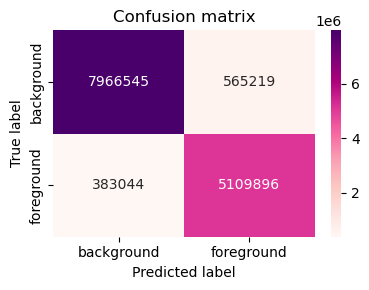

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_ft_2, test_loader_ft, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

### Focal Tversky Loss - Prueba 2

Cuando imprimimos las mascaras generados a partir del congunto de test lo que pudimos ver es que en la mayoria de los casos hay mas pixeles en blancos de los que deberian, es decir que hay mas falsos positivos, es por esto que hicimos la siguiente prueba en la que aumentamos el α para penalizar mas a los FP y disminuimos el β para fortaliecer los FN.


In [ ]:
# cargar modelo entrenado
unet_ft_4 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)

unet_ft_4, _, _ = restaurar_modelo(unet_ft_4, optimizer=None, checkpoint_path="models/unet_rgb_2.pth", device=DEVICE)

optimizer_ft_4 = torch.optim.Adam(unet_ft_4.parameters(), lr=5e-3, weight_decay=1e-5)
scheduler_ft_4 = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_ft_4, mode="min", factor=0.5, patience=4)

criterion_ft_4 = FocalTverskyLoss(alpha=0.6, beta=0.4, gamma=1, eps=0)

epoch_train_ft_4, epoch_val_ft_4 = train(
    unet_ft_4,
    optimizer,
    criterion_ft_4,
    train_loader_ft,
    val_loader_ft,
    DEVICE,
    scheduler=scheduler,
    do_early_stopping=True,
    patience=12,
    epochs=50,
    log_every=1,
)

Epoch: 001 | Train Loss: 0.14859 | Val Loss: 0.12857 | Current LR: 0.0000000122
Epoch: 002 | Train Loss: 0.14667 | Val Loss: 0.12671 | Current LR: 0.0000000122
Epoch: 003 | Train Loss: 0.14718 | Val Loss: 0.12561 | Current LR: 0.0000000122
Epoch: 004 | Train Loss: 0.14397 | Val Loss: 0.12973 | Current LR: 0.0000000122
Epoch: 005 | Train Loss: 0.14721 | Val Loss: 0.12758 | Current LR: 0.0000000122
Epoch: 006 | Train Loss: 0.14571 | Val Loss: 0.12836 | Current LR: 0.0000000122
Epoch: 007 | Train Loss: 0.14528 | Val Loss: 0.12863 | Current LR: 0.0000000122
Epoch: 008 | Train Loss: 0.14519 | Val Loss: 0.12732 | Current LR: 0.0000000122
Epoch: 009 | Train Loss: 0.14556 | Val Loss: 0.12828 | Current LR: 0.0000000122
Epoch: 010 | Train Loss: 0.14715 | Val Loss: 0.12809 | Current LR: 0.0000000122
Epoch: 011 | Train Loss: 0.14719 | Val Loss: 0.12849 | Current LR: 0.0000000122
Epoch: 012 | Train Loss: 0.14676 | Val Loss: 0.12910 | Current LR: 0.0000000122
Epoch: 013 | Train Loss: 0.14803 | Val L

Accuracy: 0.9334
Dice: 0.8954


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.95         0.94         0.94       8531764.0              
persona          0.91         0.92         0.92       5492940.0              
accuracy                                   0.93                              
macro avg        0.93         0.93         0.93      14024704.0       0.9    
weighted avg     0.93         0.93         0.93      14024704.0       0.9    
1                                                                     0.9    



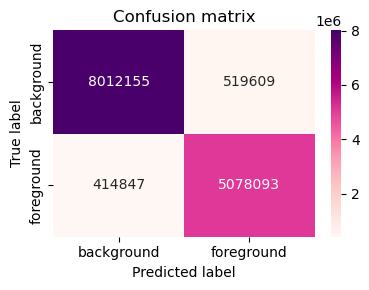

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_ft_4, test_loader_ft, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

### Observaciones Focal Tversky loss

En la primera prueba observamos que el uso de Focal Tversky Loss no produjo mejoras en el rendimiento del modelo: el valor de Dice obtenido fue **0.89**, exactamente el mismo que logramos previamente con **unet_rgb_2**.

En la segunda prueba se aprecia una mejora mínima en el valor del Dice; sin embargo, al analizar las máscaras generadas, constatamos que siguen sin ajustarse a lo esperado, especialmente en bordes y regiones alejadas del objeto principal.

## Anexo C: UNetAtt

Referencia: https://arxiv.org/pdf/1804.03999

![https://arxiv.org/pdf/1505.04597](assets/unet-attention.png)

Sobre la arquitectura de U-Net que usamos originalmente, incorporamos mecanismos de atención en los skip connections para obtener una variante tipo Attention U-Net.

Esta variante de U-Net añade Attention Gates en los skip connections del encoder.
En lugar de concatenar las features del encoder directamente con las del decoder, cada atención decide qué partes del encoder son realmente útiles para la segmentación.

El Attention Gate:
* recibe la feature del encoder y la del decoder,
* calcula un mapa de importancia (sigmoid),
* filtra la feature del encoder antes de usarla.


Esto ayuda a:
* reducir ruido en los skip connections,
* enfocarse en la persona y no en el fondo,
* mejorar bordes y coherencia de la máscara.


En resumen, la UNetAttention es una U-Net tradicional, pero con mecanismos de atención que hacen que el modelo “mire” solo las partes relevantes del encoder, logrando segmentaciones más limpias y precisas.


In [ ]:

def make_block(in_ch, out_ch, padding=0, use_bn=False, dropout=0.0):
    layers = [nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=padding)]
    if use_bn:
        layers.append(nn.BatchNorm2d(out_ch))
    layers.append(nn.ReLU(inplace=True))
    if dropout > 0.0:
        layers.append(nn.Dropout2d(dropout))

    return nn.Sequential(*layers)
    
class AttentionGate(nn.Module):
    """
    Attention gate.

    g: feature del decoder (gating signal)
    x: feature del encoder (skip connection)
    """
    def __init__(self, in_g, in_x, inter_ch):
        super().__init__()
        # Proyecciones a espacio intermedio
        self.Wg = nn.Conv2d(in_g, inter_ch, kernel_size=1, stride=1, padding=0, bias=True)
        self.Wx = nn.Conv2d(in_x, inter_ch, kernel_size=1, stride=1, padding=0, bias=True)
        # Conv para producir mapa de atención
        self.psi = nn.Conv2d(inter_ch, 1, kernel_size=1, stride=1, padding=0, bias=True)

        self.relu = nn.ReLU(inplace=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, g, x):
        # Se asume que g y x ya tienen mismas H,W
        g1 = self.Wg(g)
        x1 = self.Wx(x)
        psi = self.relu(g1 + x1)
        psi = self.sigmoid(self.psi(psi))     # (B,1,H,W)
        return x * psi                        # atenúa/amplifica canales de x por píxel


class UNetAttention(nn.Module):
    def __init__(self, n_class, n_channels=1, padding=0,
                 use_bn=False, dropout=0.0, use_attention=True):
        super().__init__()

        self.padding = padding
        self.use_attention = use_attention

        # ================ ENCODER ================
        self.conv1  = make_block(n_channels, 64,  padding, use_bn, dropout)
        self.conv2  = make_block(64,        64,  padding, use_bn, dropout)
        self.conv3  = make_block(64,        128, padding, use_bn, dropout)
        self.conv4  = make_block(128,       128, padding, use_bn, dropout)
        self.conv5  = make_block(128,       256, padding, use_bn, dropout)
        self.conv6  = make_block(256,       256, padding, use_bn, dropout)
        self.conv7  = make_block(256,       512, padding, use_bn, dropout)
        self.conv8  = make_block(512,       512, padding, use_bn, dropout)

        # ================ BOTTLENECK ================
        self.conv9  = make_block(512,       1024, padding, use_bn, dropout)
        self.conv10 = make_block(1024,      1024, padding, use_bn, dropout)

        # ================ DECODER CONVS ================
        self.conv11 = make_block(1024, 512, padding, use_bn, dropout)  # d4
        self.conv12 = make_block(512,  512, padding, use_bn, dropout)

        self.conv13 = make_block(512,  256, padding, use_bn, dropout)  # d3
        self.conv14 = make_block(256,  256, padding, use_bn, dropout)

        self.conv15 = make_block(256,  128, padding, use_bn, dropout)  # d2
        self.conv16 = make_block(128,  128, padding, use_bn, dropout)

        self.conv17 = make_block(128,   64, padding, use_bn, dropout)  # d1
        self.conv18 = make_block(64,    64, padding, use_bn, dropout)

        # ================ UPCONVS ================
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(512,  256, kernel_size=2, stride=2)
        self.upconv3 = nn.ConvTranspose2d(256,  128, kernel_size=2, stride=2)
        self.upconv4 = nn.ConvTranspose2d(128,   64, kernel_size=2, stride=2)

        self.maxPool = nn.MaxPool2d(2)
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

        # ================ ATTENTION GATES ================
        if self.use_attention:
            # Para cada nivel, g = feature del decoder, x = feature del encoder
            self.att4 = AttentionGate(in_g=512, in_x=512, inter_ch=256)  # nivel e4-d4
            self.att3 = AttentionGate(in_g=256, in_x=256, inter_ch=128)  # nivel e3-d3
            self.att2 = AttentionGate(in_g=128, in_x=128, inter_ch=64)   # nivel e2-d2
            self.att1 = AttentionGate(in_g=64,  in_x=64,  inter_ch=32)   # nivel e1-d1

    def forward(self, x):
        # ================ ENCODER ================
        e1 = self.conv1(x)
        e1 = self.conv2(e1)
        p1 = self.maxPool(e1)

        e2 = self.conv3(p1)
        e2 = self.conv4(e2)
        p2 = self.maxPool(e2)

        e3 = self.conv5(p2)
        e3 = self.conv6(e3)
        p3 = self.maxPool(e3)

        e4 = self.conv7(p3)
        e4 = self.conv8(e4)
        p4 = self.maxPool(e4)

        # ================ BOTTLENECK ================
        b = self.conv9(p4)
        b = self.conv10(b)

        # ================ DECODER ================
        # ---- Nivel 4 (más profundo) ----
        d4 = self.upconv1(b)  # (B,512,H',W')

        # Alinear tamaños encoder/decoder
        if e4.shape[2:] != d4.shape[2:]:
            e4_ = center_crop(e4, d4.shape[2], d4.shape[3])
        else:
            e4_ = e4

        if self.use_attention:
            e4_ = self.att4(d4, e4_)  # filtra skip con atención

        d4 = torch.cat([e4_, d4], dim=1)
        d4 = self.conv11(d4)
        d4 = self.conv12(d4)

        # ---- Nivel 3 ----
        d3 = self.upconv2(d4)  # (B,256,H',W')

        if e3.shape[2:] != d3.shape[2:]:
            e3_ = center_crop(e3, d3.shape[2], d3.shape[3])
        else:
            e3_ = e3

        if self.use_attention:
            e3_ = self.att3(d3, e3_)

        d3 = torch.cat([e3_, d3], dim=1)
        d3 = self.conv13(d3)
        d3 = self.conv14(d3)

        # ---- Nivel 2 ----
        d2 = self.upconv3(d3)  # (B,128,H',W')

        if e2.shape[2:] != d2.shape[2:]:
            e2_ = center_crop(e2, d2.shape[2], d2.shape[3])
        else:
            e2_ = e2

        if self.use_attention:
            e2_ = self.att2(d2, e2_)

        d2 = torch.cat([e2_, d2], dim=1)
        d2 = self.conv15(d2)
        d2 = self.conv16(d2)

        # ---- Nivel 1 (más superficial) ----
        d1 = self.upconv4(d2)  # (B,64,H',W')

        if e1.shape[2:] != d1.shape[2:]:
            e1_ = center_crop(e1, d1.shape[2], d1.shape[3])
        else:
            e1_ = e1

        if self.use_attention:
            e1_ = self.att1(d1, e1_)

        d1 = torch.cat([e1_, d1], dim=1)
        d1 = self.conv17(d1)
        d1 = self.conv18(d1)

        # ================ OUTPUT ================
        return self.outconv(d1)      

In [ ]:
model_test = UNetAttention(
    n_class=1,
    n_channels=3,    
    padding=1,
    use_bn=False,    
    dropout=0.1,
    use_attention=True
) 
summary(model_test, input_size=(1, 3, 572, 572)) # input size = batch_size, channels, h, w)

Layer (type:depth-idx)                   Output Shape              Param #
UNetAttention                            [1, 1, 560, 560]          --
├─Sequential: 1-1                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-1                       [1, 64, 572, 572]         1,792
│    └─ReLU: 2-2                         [1, 64, 572, 572]         --
│    └─Dropout2d: 2-3                    [1, 64, 572, 572]         --
├─Sequential: 1-2                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-4                       [1, 64, 572, 572]         36,928
│    └─ReLU: 2-5                         [1, 64, 572, 572]         --
│    └─Dropout2d: 2-6                    [1, 64, 572, 572]         --
├─MaxPool2d: 1-3                         [1, 64, 286, 286]         --
├─Sequential: 1-4                        [1, 128, 286, 286]        --
│    └─Conv2d: 2-7                       [1, 128, 286, 286]        73,856
│    └─ReLU: 2-8                         [1, 128, 286, 286]        --
│   

## Anexo D: UP-Sample

In [ ]:
from numpy import False_


train_loader_up, val_loader_up, test_loader_up, kaggle_loader_up = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,  
)

unet_up = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3, use_upsample=True).to(DEVICE)

criterion_up = combined_loss


optimizer = torch.optim.Adam(unet_up.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=4
)

epoch_train_errors_up, epoch_val_errors_up = train(
    unet_up, optimizer, criterion_up, train_loader_up, val_loader_up, DEVICE, scheduler=scheduler,
    do_early_stopping=False_, patience=12, epochs=200, log_every=5,
    checkpoint_path="models/unet_up_2.pth", 
    loss_ponderada=True
)

Epoch: 002 | Train Loss: 0.47124 | Val Loss: 0.56834 | Current LR: 0.0001000000
Epoch: 005 | Train Loss: 0.42298 | Val Loss: 0.41350 | Current LR: 0.0001000000
Epoch: 010 | Train Loss: 0.36971 | Val Loss: 0.32621 | Current LR: 0.0001000000
Epoch: 015 | Train Loss: 0.33330 | Val Loss: 0.28828 | Current LR: 0.0001000000
Epoch: 020 | Train Loss: 0.30751 | Val Loss: 0.26352 | Current LR: 0.0001000000
Epoch: 025 | Train Loss: 0.28817 | Val Loss: 0.23555 | Current LR: 0.0001000000
Epoch: 030 | Train Loss: 0.26325 | Val Loss: 0.22897 | Current LR: 0.0001000000
Epoch: 035 | Train Loss: 0.25202 | Val Loss: 0.21466 | Current LR: 0.0001000000
Epoch: 040 | Train Loss: 0.23766 | Val Loss: 0.20628 | Current LR: 0.0001000000
Epoch: 045 | Train Loss: 0.22135 | Val Loss: 0.18933 | Current LR: 0.0001000000
Epoch: 050 | Train Loss: 0.21044 | Val Loss: 0.18105 | Current LR: 0.0001000000
Epoch: 055 | Train Loss: 0.20550 | Val Loss: 0.17352 | Current LR: 0.0001000000
Epoch: 060 | Train Loss: 0.18916 | Val L

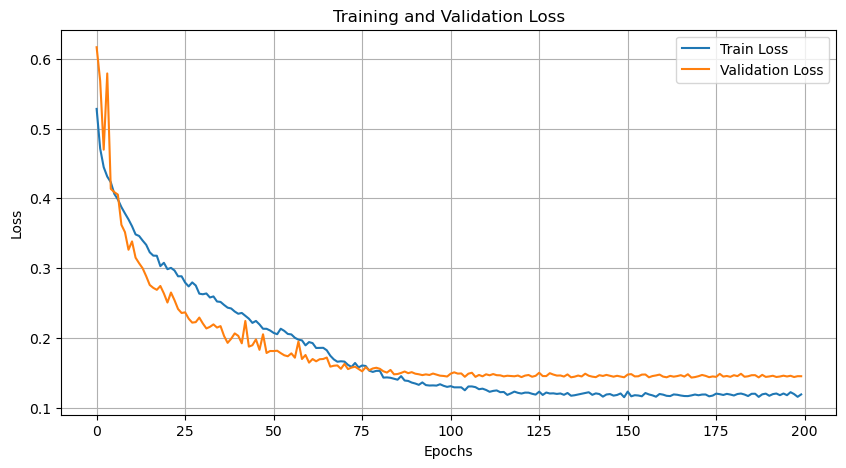

In [ ]:
plot_training(epoch_train_errors_up, epoch_val_errors_up)

Accuracy: 0.9345
Dice: 0.8978


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.97         0.92         0.94       8531764.0              
persona          0.89         0.95         0.92       5492940.0              
accuracy                                   0.93                              
macro avg        0.93         0.94         0.93      14024704.0       0.9    
weighted avg     0.94         0.93         0.93      14024704.0       0.9    
1                                                                     0.9    



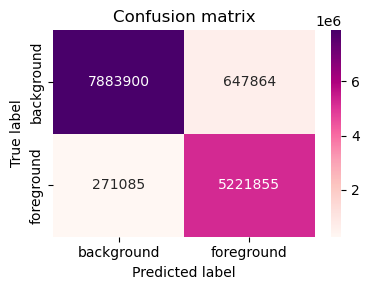

In [ ]:
acc, rep, cm = model_segmentation_report(
    unet_up, test_loader_up, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

## Anexo F: Leaky-RELU

En esta seccion probamos usar LeakyReLU como funcion de activacion, para ver si obteniamos un mejor resultado al no "matar" todo lo que diera < 0. Lo que nos hizo pensar en esta prueba fue el hecho de que hay muchas imagenes que son muy oscuras, y no se distingue bien la persona del fondo, por lo que el modelo asumia que era todo fondo. La idea aca es verificar si la leaky relu deja pasar un poco mas de informacion en esos casos, sin perjudicar los demas resultados.

In [ ]:
train_loader_leaky, val_loader_leaky, test_loader_leaky, kaggle_loader_leaky = get_seg_dataloaders(
    batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, seed=SEED, rgb=True,
    train_transform_img=base_img_tf,
    train_transform_mask=base_mask_tf,
    val_transform_img=base_img_tf,
    val_transform_mask=base_mask_tf,

)

unet_leaky = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, use_leaky_relu=True).to(DEVICE)
criterion_leaky = combined_loss_edge


optimizer = torch.optim.Adam(unet_leaky.parameters(), lr=5e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)

epoch_train_errors_leaky, epoch_val_errors_leaky =  train(
    unet_leaky, optimizer, criterion_leaky, train_loader_leaky, val_loader_leaky, DEVICE, scheduler=scheduler,
    do_early_stopping=True, patience=10, epochs=100, log_every=1,
    checkpoint_path="/content/drive/MyDrive/models/unet_leaky.pth", loss_ponderada=False
)

Epoch: 001 | Train Loss: 0.45332 | Val Loss: 0.38510 | Current LR: 0.0000500000
Epoch: 002 | Train Loss: 0.36256 | Val Loss: 0.34702 | Current LR: 0.0000500000
Epoch: 003 | Train Loss: 0.32368 | Val Loss: 0.30364 | Current LR: 0.0000500000
Epoch: 004 | Train Loss: 0.29413 | Val Loss: 0.29770 | Current LR: 0.0000500000
Epoch: 005 | Train Loss: 0.27531 | Val Loss: 0.27031 | Current LR: 0.0000500000
Epoch: 006 | Train Loss: 0.25451 | Val Loss: 0.25183 | Current LR: 0.0000500000
Epoch: 007 | Train Loss: 0.23139 | Val Loss: 0.23780 | Current LR: 0.0000500000
Epoch: 008 | Train Loss: 0.22355 | Val Loss: 0.22762 | Current LR: 0.0000500000
Epoch: 009 | Train Loss: 0.20408 | Val Loss: 0.21707 | Current LR: 0.0000500000
Epoch: 010 | Train Loss: 0.19277 | Val Loss: 0.20923 | Current LR: 0.0000500000
Epoch: 011 | Train Loss: 0.18084 | Val Loss: 0.20411 | Current LR: 0.0000500000
Epoch: 012 | Train Loss: 0.17280 | Val Loss: 0.21146 | Current LR: 0.0000500000
Epoch: 013 | Train Loss: 0.16585 | Val L